In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels
import math
import scipy.stats
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.stats import t
from scipy.stats import f

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
def graphs(data):
  data.plot(figsize = (15, 7))
  plt.show()
  sns.displot(data, kind = 'kde')
  plt.show()
  sns.boxplot(data['RTS'])
  plt.show()

In [ ]:
def student_test (y1, y2, n1, n2, var1, var2, a):
  if (var1 != var2):
    St = ((y1-y2)/math.sqrt(var1/(n1-1)+var2/(n2-1)))
  else:
    St = ((y1-y2)/var1 * math.sqrt(((n1)*(n2))/(n1+n2)))
  return St

In [ ]:
def _get_updown_sub_serias(series):
    subseries = [None, ]
    for i in range(len(series)):
        if i == 1:
            pass
        else:
            if (series[i] - series[i-1]) > 0:
                subseries.append('+')
            else:
                subseries.append('-')
    return subseries

def _get_numeric_updown_criteria(subseries):
    number_subseries = 0
    numeric_subseries = [None, ]
    for i in range(len(subseries)):
        if i == 1:
            pass
        else:
            if subseries[i] != subseries[i-1]:
                number_subseries += 1
                numeric_subseries.append(number_subseries)
            else:
                numeric_subseries.append(number_subseries)
                
    return numeric_subseries
    

def updown_criteria(series):
    subseries = _get_updown_sub_serias(series)
    numeric_subseries = _get_numeric_updown_criteria(subseries)
    sub_df = pd.DataFrame({'series': series, 'subseries': subseries, 'numeric_subs': numeric_subseries})
    val_count_sub_df = sub_df['numeric_subs'].value_counts()
    total_subdf = pd.merge(sub_df, val_count_sub_df, how='left', left_on='numeric_subs', right_index=True)
    
    v_n = total_subdf['numeric_subs_x'].max()
    t_n = total_subdf['numeric_subs_y'].max()
    
    u_t = 1.96
    
    n = total_subdf.shape[0]-1
    
    criteria_x = 1/3 * (2*n-1) - u_t* np.sqrt((16*n-29)/90)
    
    if n <= 26:
        criteria_y = 5
    elif n>26 and n <= 153:
        criteria_y = 6
    elif n>153 and n <= 1170:
        criteria_y = 7
    else:
        criteria_y = 8    
    
    print(f'Число серий v_n = {v_n} больше критического значения равного {criteria_x}: {v_n > criteria_x}')
    print(f'Длина максимальной серии t_n = {t_n} меньше критического значения равного {criteria_y}: {t_n < criteria_y}')
    print('При нарушении хотя бы одного из условий ряд нестационарный')

In [ ]:
from scipy.stats import mannwhitneyu
def test_mannwhitneyu(series):
    stat, p = mannwhitneyu(series[:int(len(series)/2)], series[int(len(series)/2):])
    print('stat={0:.3g}, p={0:.3g}'.format(stat, p))
    if p > 0.05:
        print('Probably the same distribution')
    else:
        print('Probably different distributions')

In [ ]:
def _get_ranked(series):
    series_max_index = len(series)
    first_sublist = list(range(2,series_max_index,4))
    first_sublist = sorted(first_sublist + list(range(min(first_sublist)+1, max(first_sublist)+2, 4)))
    second_sublist = [col for col in list(range(1,series_max_index+1)) if col not in first_sublist]
    first_sublist.reverse()
    return second_sublist + first_sublist  

def siegel_tukey(series):
    first_subsample, second_subsample = series[:int(len(series)/2)], series[int(len(series)/2):]
    first_subsample, second_subsample = pd.DataFrame({'values': first_subsample}), pd.DataFrame({'values': second_subsample})
    first_subsample['class'] = 'first'
    second_subsample['class'] = 'second'
    final_df = pd.concat([first_subsample,second_subsample]).sort_values(by='values')
    
    final_df['ranked'] = _get_ranked(final_df['values'])
    _ = pd.pivot_table(final_df, index='class', aggfunc=['sum'])['sum']['ranked']
    mean_w = _['first']-len(first_subsample)*(len(first_subsample)+len(second_subsample)+1)/2 
    disp_w = len(first_subsample)*len(second_subsample)*(len(first_subsample)+len(second_subsample)+1)/12
    if disp_w != 0:
        z_value = mean_w/np.sqrt(disp_w)
    else:
        print(f'disp_w = 0')
        
    if z_value < 0:
        z_value = (mean_w + 0.5) / np.sqrt(disp_w)
    else:
        z_value = (mean_w - 0.5) / np.sqrt(disp_w)
    print(f'z value: {z_value:.3f}')
    if z_value < 1.97 and z_value > -1.97:
        print('Probably the same distribution')
    else:
        print('Probably different distributions')

# Изначальные данные

In [ ]:
df = pd.read_excel('./data_kursovaya.xlsx')

In [ ]:
df.tail(7)

,TRADEDATE,RTS
1256,2022-02-10,1546.79
1257,2022-02-11,1470.10
1258,2022-02-14,1426.09
1259,2022-02-15,1498.04
1260,2022-02-16,1524.51
1261,2022-02-17,1450.02
1262,2022-02-18,1391.31


In [ ]:
df.describe()

,RTS
count,1263.000000
mean,1298.124394
std,210.963574
min,832.260000
25%,1134.375000
50%,1246.990000
75%,1446.405000
max,1919.580000


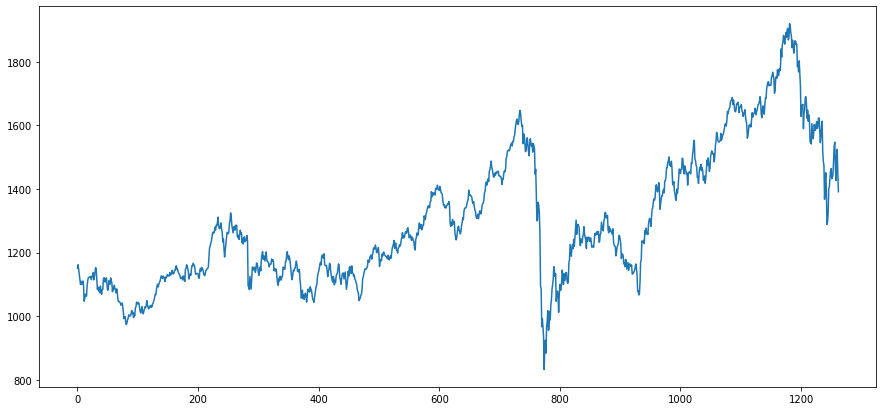

In [ ]:
df['RTS'].plot(figsize = (15, 7))

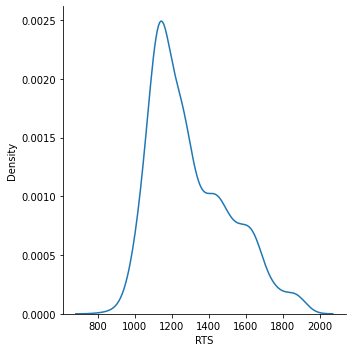

In [ ]:
sns.displot(df, x = 'RTS', kind='kde')

Распределение унимодальное, близкое к нормальному

# По дням с заполненными пропусками

                RTS
TRADEDATE          
2020-03-20   924.22
2020-03-21   924.22
2020-03-22   924.22
2020-03-23   883.78
2020-03-24   965.32
2020-03-25   981.69
2020-03-26  1017.03


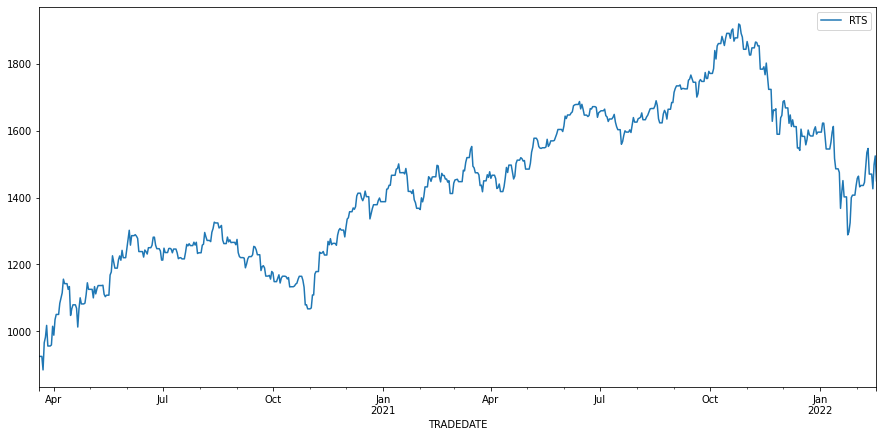

In [ ]:
df['TRADEDATE'] = pd.to_datetime(df['TRADEDATE'])
df_d = df.resample('D',  on='TRADEDATE').mean().ffill()
df_d = df_d[len(df_d)-701:len(df_d)-1]
print(df_d.head(7))
df_d.plot(figsize = (15, 7))

In [ ]:
import statsmodels.api as sm
from scipy.stats import shapiro
from scipy.stats import norm
from statsmodels.iolib.table import SimpleTable
def test_normal_dist(series):
    print('================')
    print('Тест Jarque Bera')
    row =  [u'JB', u'p-value', u'skew', u'kurtosis']
    jb_test = sm.stats.stattools.jarque_bera(series)
    a = np.vstack([jb_test])
    itog = SimpleTable(a, row)
    print(itog)
    alpha = 0.05
    # if itog['p-value'] > alpha:
    #     print('Принять гипотезу о нормальности')
    # else:
    #     print('Отклонить гипотезу о нормальности')       
    print('')
    print('================')
    print('Тест Шапиро-Уилк')
    stat, p = shapiro(series) # тест Шапиро-Уилк 
    print('Statistics=%.3f, p-value=%.3f' % (stat, p))
    alpha = 0.05
    if p > alpha:
        print('Принять гипотезу о нормальности')
    else:
        print('Отклонить гипотезу о нормальности')        
            
def get_distribution(series):
    print(test_normal_dist(series))
    
    fig = plt.figure(figsize=(12, 10))
    gs = fig.add_gridspec(4, 1)
    ax0 = fig.add_subplot(gs[0, 0])
    ax1 = fig.add_subplot(gs[1, 0])
    ax2 = fig.add_subplot(gs[2, 0])
    ax3 = fig.add_subplot(gs[3, 0])
    sns.kdeplot(norm(loc=series.mean(), scale=np.std(series)).rvs(size=700), ax=ax0, color='#b3e8c9', fill=True, alpha=1)
    sns.kdeplot(ax=ax0, x=series)     
    sns.histplot(ax=ax1, x=series, fill=False)     
    sns.boxplot(series, ax=ax2)
    sm.qqplot(series, ax=ax3, line="s")

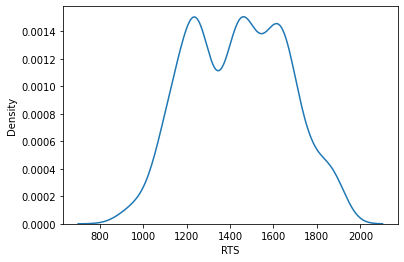

In [ ]:
sns.kdeplot(df_d['RTS'])

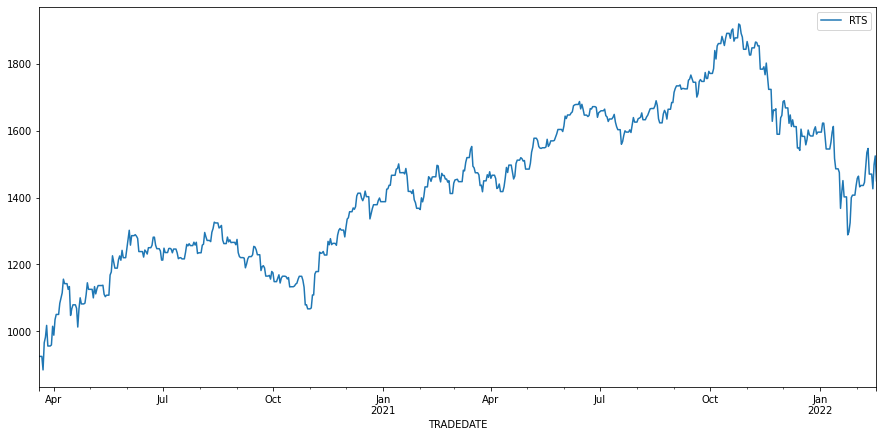

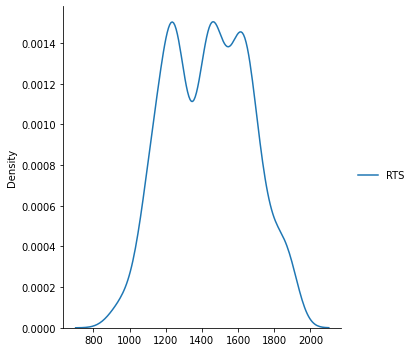

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


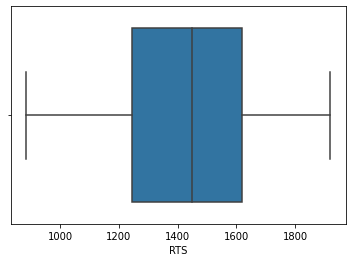

In [ ]:
graphs(df_d)

Распределение унимодальное

In [ ]:
def kurt_skew(data):
  print( 'excess kurtosis of normal distribution (should be 0): {}'.format( kurtosis(data) ))
  print( 'skewness of normal distribution (should be 0): {}'.format( skew(data) ))

In [ ]:
from scipy.stats import kurtosis, skew
print( 'excess kurtosis of normal distribution (should be 0): {}'.format( kurtosis(df_d['RTS']) ))
print( 'skewness of normal distribution (should be 0): {}'.format( skew(df_d['RTS']) ))

excess kurtosis of normal distribution (should be 0): -0.8281472849396989
skewness of normal distribution (should be 0): 0.032916504337159404


In [ ]:
def outliers(data, i): 
  data = data.sort_values(by = df_d.iloc[:,0].name)
  data.iloc[:,0][0:i] = data.iloc[:,0][i]
  data.iloc[:,0][(len(data)-i):len(data)] = data.iloc[:,0][len(data) - i]
  data = data.sort_index()
  return(data)

In [ ]:
df_d = outliers(df_d, 3)

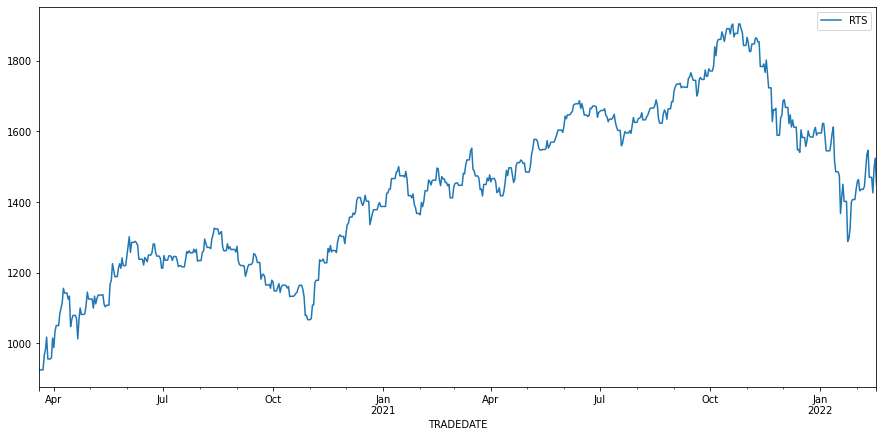

In [ ]:
df_d.plot(figsize = (15, 7))

The above graph has right (positive)skewness. It means that the outliers are to the right (long tail to the right). Left (negative) skewness means that the outliers are to the left.

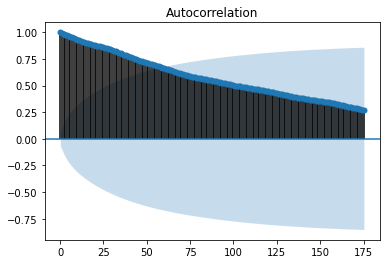

In [ ]:
plot_acf(df_d['RTS'], lags=175)
plt.show()

Кареллограмма быстро затухает, можно предположить нестационарность ряда. Также она уходит в отрицательные значения, значит имеет место случайное блуждание

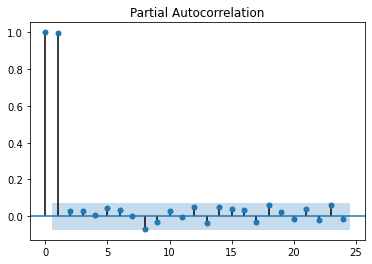

In [ ]:
plot_pacf(df_d['RTS'], lags=24)
plt.show()

In [ ]:
def t_f_criterion(data):
  X = data.values
  split = round(len(X) / 2)
  X1, X2 = X[0:split], X[split:]
  mean1, mean2 = X1.mean(), X2.mean()
  var1, var2 = X1.var(), X2.var()
  print('Тестирование средних. Статистика Стьюдента: {}. Критическое значение: {}'.format(((mean1-mean2)/math.sqrt(var1+var2)), t.ppf(0.95, len(X1)-1)))
  print('Тестирование дисперсий. Статистика Фишера: {}. Критическое значение: {}'.format(var2/var1, f.ppf(0.95, len(X1)-1, len(X2)-1)))

Нулевая гипотеза принимается. Мат ожидания и дисперсии равны, но это неподходящий тест, так как распределение бимодальное

In [ ]:
import statistics
def median_criterion (data):
  result = []
  for i in range(len(data)):
    if data[i] < statistics.median(data):
      result.append('-')
    elif data[i] == statistics.median(data): result.append(' ')
    else: result.append('+')
  vt = 1
  tmax = 1
  t = 1
  for i in range(1, len(result)):
    if result[i] == result[i-1]: 
      vt = vt
      t += 1
      if t > tmax: tmax = t
    else:  
      vt +=1
      t = 0
  print('Число серий = {} больше рассчитанного {}: {}'.format(vt, (0.5*(len(data) + 2) - 1.96*math.sqrt(len(data)-1)), vt > (0.5*(len(data) + 2) - 1.96*math.sqrt(len(data)-1))))
  print('Максимальная длина серии = {} меньше рассчитанного {}: {}'.format(tmax, (1.43 * math.log(len(data + 1))), tmax < (1.43 * math.log(len(data + 1)))))
  print('При нарушении хоть одного условия, ряд не стационарный')
  print(statistics.median(data))
  print(result)


In [ ]:
median_criterion(df_d['RTS'])

Число серий = 24 больше рассчитанного 299.180328059703: False
Максимальная длина серии = 294 меньше рассчитанного 9.368044879112068: False
При нарушении хоть одного условия, ряд не стационарный
1447.885
['-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '

In [ ]:
import statistics
def abbe_criterion (data):
  result = []
  sumy = [data[0]-np.average(data)]
  for i in range(1, len(data)):
    result.append((data[i]-math.pow(data[i-1], 2)))
    sumy.append(data[i]-np.average(data))
  g2T = 1 / (2 * (len(data) - 1)) * sum(result)
  sigma2 = 1 / (len(data) - 1) * sum(sumy)
  yt = g2T / sigma2
  u = scipy.stats.norm.ppf(0.05)
  print('Рабочая статистика Аббе = {} меньше либо равна рассчитанного ymin0,05(T) = {}: {}'.format(yt, 1 + u / math.sqrt(len(data) + 0.5 * (1 + math.pow(u, 2))), yt <= 1 + u / math.sqrt(len(data) + 0.5 * (1 + math.pow(u, 2)))))

In [ ]:
print(abbe_criterion(df_d['RTS']))
print('Если условие выполняется, то ряд не является стационарным')

Рабочая статистика Аббе = 1.5439035179613985e+19 меньше либо равна рассчитанного ymin0,05(T) = 0.9379124894042934: False
None
Если условие выполняется, то ряд не является стационарным


In [ ]:
from statsmodels.tsa.stattools import adfuller
def dicky_fuller(series):
  X = series.values
  result = adfuller(X)
  print('ADF Statistic: %f' % result[0])
  print('p-value: %f' % result[1])
  print('Critical Values:')
  for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))
  print('p-value > 0.05: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.')
  print('p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.')

https://machinelearningmastery.com/time-series-data-stationary-python/

In [ ]:
dicky_fuller(df_d['RTS'])

ADF Statistic: -2.291888
p-value: 0.174598
Critical Values:
	1%: -3.440
	5%: -2.866
	10%: -2.569
p-value > 0.05: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.


In [ ]:
len(df_d['RTS'])

700

In [ ]:
updown_criteria(df_d['RTS'])

Число серий v_n = 307.0 больше критического значения равного 443.84592016757136: False
Длина максимальной серии t_n = 8.0 меньше критического значения равного 7: False
При нарушении хотя бы одного из условий ряд нестационарный


In [ ]:
from scipy.stats import mannwhitneyu
test_mannwhitneyu(df_d['RTS'])

stat=2.23e+03, p=2.23e+03
Probably different distributions


In [ ]:
siegel_tukey(df_d['RTS'])

z value: 0.014
Probably the same distribution


In [ ]:
from scipy import stats
d_boxcox, _ = stats.boxcox(df_d['RTS'])
d_boxcox = pd.DataFrame(data = d_boxcox, index = df_d[0:len(df_d)].index, columns = ['RTS'])
# graphs(d_boxcox)

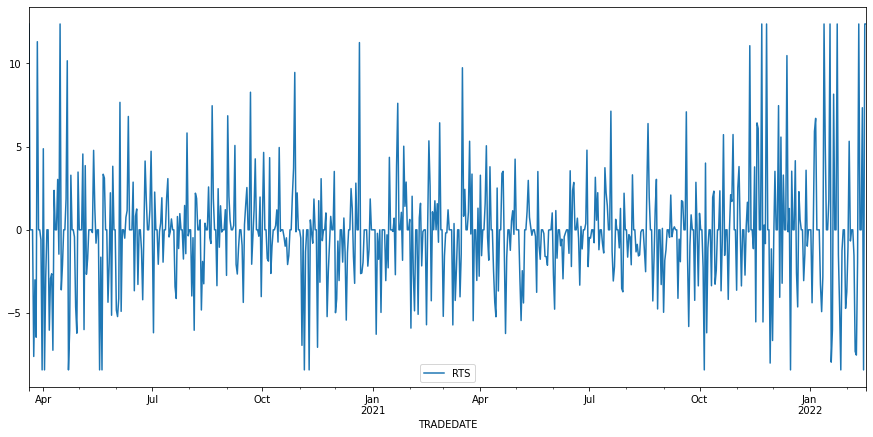

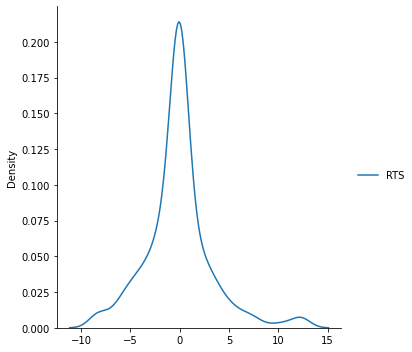

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


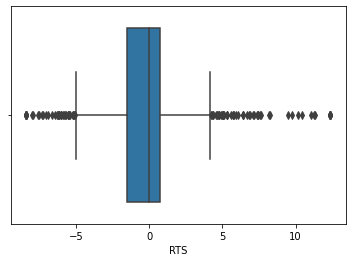

In [ ]:
d_boxcox_diff = d_boxcox.shift(1) - d_boxcox[0:len(d_boxcox)-2]
d_boxcox_diff = outliers(d_boxcox_diff, 10)
graphs(d_boxcox_diff)

Посчитаем первую разность
### Первая разность



In [ ]:
# d_first_diff = []
# for i in range(1, len(df_d['RTS'])):
#   d_first_diff.append(df_d['RTS'][i] - df_d['RTS'][i-1])
# print(d_first_diff)
# d_first_diff = pd.DataFrame(data = d_first_diff, index = df_d[1:len(df_d)].index, columns = ['RTS'])

In [ ]:
d_first_diff = df_d.shift(1) - df_d[0:len(df_d)]

In [ ]:
d_first_diff_log = np.log(df_d.shift(1)) - np.log(df_d[0:len(df_d)-2])

In [ ]:
d_first_diff_log.describe()

,RTS
count,697.000000
mean,-0.000693
std,0.015244
min,-0.056681
25%,-0.006386
50%,0.000000
75%,0.003073
max,0.084592


In [ ]:
d_first_diff_log = outliers(d_first_diff_log, 3)

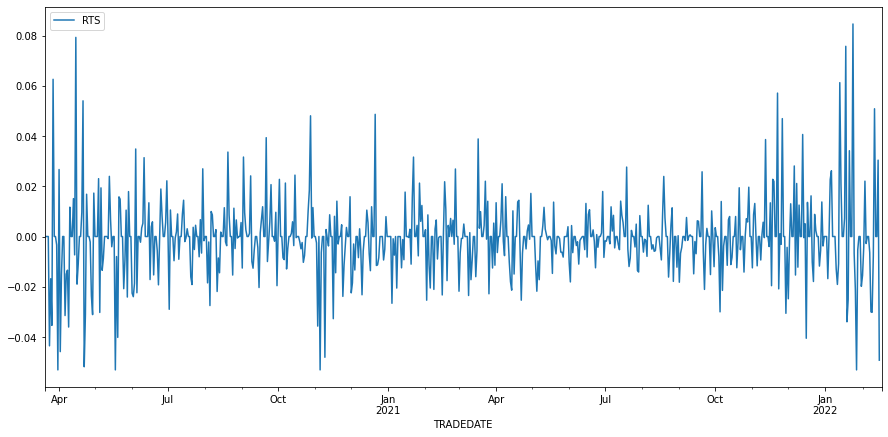

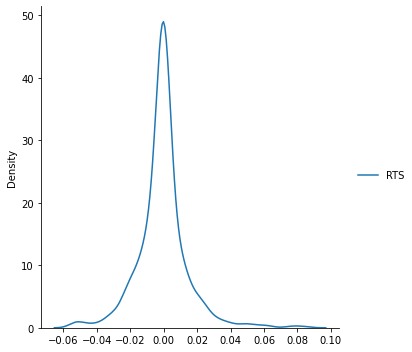

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


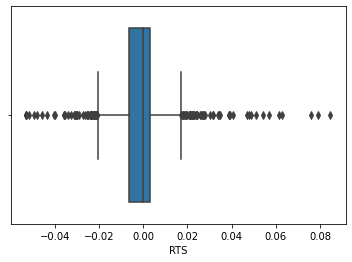

In [ ]:
graphs(d_first_diff_log)

In [ ]:
d_first_diff = outliers(d_first_diff, 5)

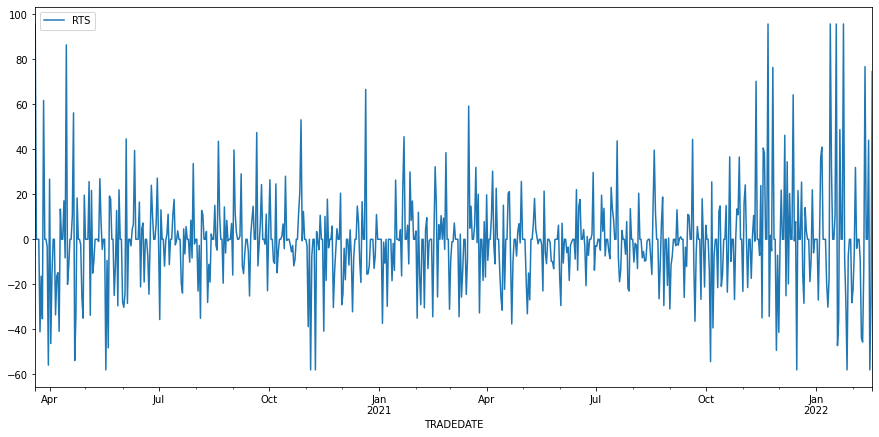

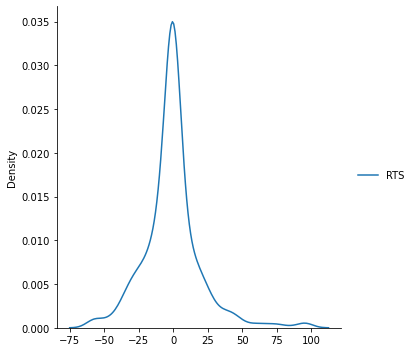

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


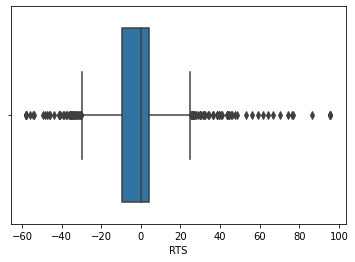

In [ ]:
graphs(d_first_diff)

In [ ]:
kurt_skew(d_first_diff['RTS'])

excess kurtosis of normal distribution (should be 0): 4.379929203573606
skewness of normal distribution (should be 0): 0.9730933839682897


In [ ]:
d_first_diff.describe()

,RTS
count,700.000000
mean,-0.595043
std,20.861899
min,-58.020000
25%,-9.360000
50%,0.000000
75%,4.362500
max,95.640000


In [ ]:
import numpy as np
# фазовый анализ типа
negative = []
positive = []
sum_pos =0
sum_neg=0
for i in range(len(d_first_diff)):
  if d_first_diff['RTS'][i] >= 0: 
    negative.append(sum_neg)
    sum_neg = 0
    sum_pos +=1
  else: 
    positive.append(sum_pos)
    sum_pos = 0
    sum_neg +=1
print(len(negative), len(positive), len(negative) + len(positive), np.array(negative).max(), np.array(positive).max(), negative, positive)

421 279 700 5 8 [0, 0, 0, 0, 3, 0, 0, 2, 2, 0, 4, 0, 0, 0, 1, 2, 0, 0, 0, 2, 0, 0, 3, 0, 0, 0, 0, 1, 2, 0, 0, 1, 0, 1, 0, 3, 0, 0, 0, 2, 1, 0, 0, 3, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 1, 0, 0, 0, 2, 0, 0, 2, 1, 0, 0, 1, 1, 1, 0, 3, 0, 0, 0, 0, 3, 0, 0, 0, 2, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 3, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 1, 1, 0, 0, 0, 2, 2, 0, 0, 0, 1, 1, 0, 5, 0, 0, 0, 0, 1, 0, 0, 2, 2, 0, 1, 2, 0, 0, 1, 1, 1, 0, 0, 3, 0, 0, 0, 4, 0, 1, 3, 0, 0, 0, 2, 0, 0, 0, 4, 0, 2, 0, 0, 0, 0, 3, 1, 0, 4, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 2, 0, 1, 0, 2, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 4, 0, 0, 0, 1, 2, 0, 2, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 2, 0, 0, 3, 1, 0, 0, 0, 3, 0, 1, 0, 1, 0, 0, 0, 4, 0, 0, 0, 0, 0, 1, 0, 2, 2, 0, 5, 0, 0, 2, 1, 0, 5, 0, 1, 1, 0, 0, 0, 0, 2, 1, 0, 0, 0, 3, 0, 1, 0, 0, 1, 0, 2, 0, 0, 0, 0, 0, 3, 0, 0, 1, 2, 0, 0, 4, 0, 0, 5, 0, 2, 0, 0, 0, 0, 2, 0, 1, 0, 1, 3, 0, 1, 1, 0, 0, 0, 3, 0, 0, 0,

In [ ]:
t_f_criterion(d_first_diff['RTS'])

Тестирование средних. Статистика Стьюдента: -0.04258361840577531. Критическое значение: 1.6492314108421735
Тестирование дисперсий. Статистика Фишера: 1.3258308845545068. Критическое значение: 1.19283654798872


In [ ]:
median_criterion(d_first_diff['RTS'])

Число серий = 405 больше рассчитанного 299.180328059703: True
Максимальная длина серии = 4 меньше рассчитанного 9.368044879112068: True
При нарушении хоть одного условия, ряд не стационарный
0.0
['+', ' ', ' ', ' ', '-', '-', '-', '+', ' ', ' ', '-', '-', '+', '-', '-', ' ', ' ', '-', '-', '-', '-', '+', ' ', ' ', '+', '-', '+', '-', '-', ' ', ' ', '+', '+', '-', '-', '+', ' ', ' ', '-', '-', '-', '+', ' ', ' ', ' ', '+', '-', '+', '-', '-', ' ', ' ', ' ', '-', '+', '+', '-', ' ', ' ', '-', '-', '-', '+', '+', ' ', ' ', '-', '-', '+', '-', '+', ' ', ' ', '-', '-', '-', '+', '-', ' ', ' ', '-', '+', '+', '+', ' ', ' ', ' ', '+', '-', '+', '+', '-', ' ', ' ', '-', '-', ' ', '+', '+', ' ', ' ', '+', '+', ' ', '-', '+', ' ', ' ', '-', '-', '+', '+', '-', ' ', ' ', '+', '+', '-', '-', '+', ' ', ' ', '-', '-', '+', '-', '+', ' ', ' ', '-', '+', '-', '+', '-', ' ', ' ', '-', '-', '-', '+', '+', ' ', ' ', '+', '-', '-', '-', '+', ' ', ' ', '+', '-', '-', '+', '+', ' ', ' ', '-', '+', '-', '+',

In [ ]:
d_first_diff = d_first_diff.dropna()

In [ ]:
d_first_diff.isna().sum()

RTS    0
dtype: int64

In [ ]:
dicky_fuller(d_first_diff['RTS'])

ADF Statistic: -20.183916
p-value: 0.000000
Critical Values:
	1%: -3.440
	5%: -2.866
	10%: -2.569
p-value > 0.05: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.


In [ ]:
abbe_criterion(d_first_diff['RTS'])

Рабочая статистика Аббе = -1.6461296048031178e+17 меньше либо равна рассчитанного ymin0,05(T) = 0.9379124894042934: True


In [ ]:
siegel_tukey(d_first_diff['RTS'])

z value: -0.101
Probably the same distribution


In [ ]:
test_mannwhitneyu(d_first_diff['RTS'])

stat=6.1e+04, p=6.1e+04
Probably the same distribution


Ряд стационарный по трем тестам

In [ ]:
def make_autocorr_plot(series, lags=24):
    background_color = '#f6f5f5'
    plt.rcParams['figure.dpi'] = 600
    fig = plt.figure(figsize=(12, 10), facecolor=background_color)
    gs = fig.add_gridspec(2, 1)
    ax0 = fig.add_subplot(gs[0, 0])
    ax1 = fig.add_subplot(gs[1, 0])

    ax0.set_facecolor(background_color)
    ax1.set_facecolor(background_color)
    
    
    background_color = '#f6f5f5'
    ax0.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
    ax0.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
    ax0.axes.xaxis.set_visible(False)
    ax1.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
    ax1.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
    
    plot_acf(series, lags=lags, zero=False, ax=ax0);
    plot_pacf(series, lags=lags, zero=False, ax=ax1);

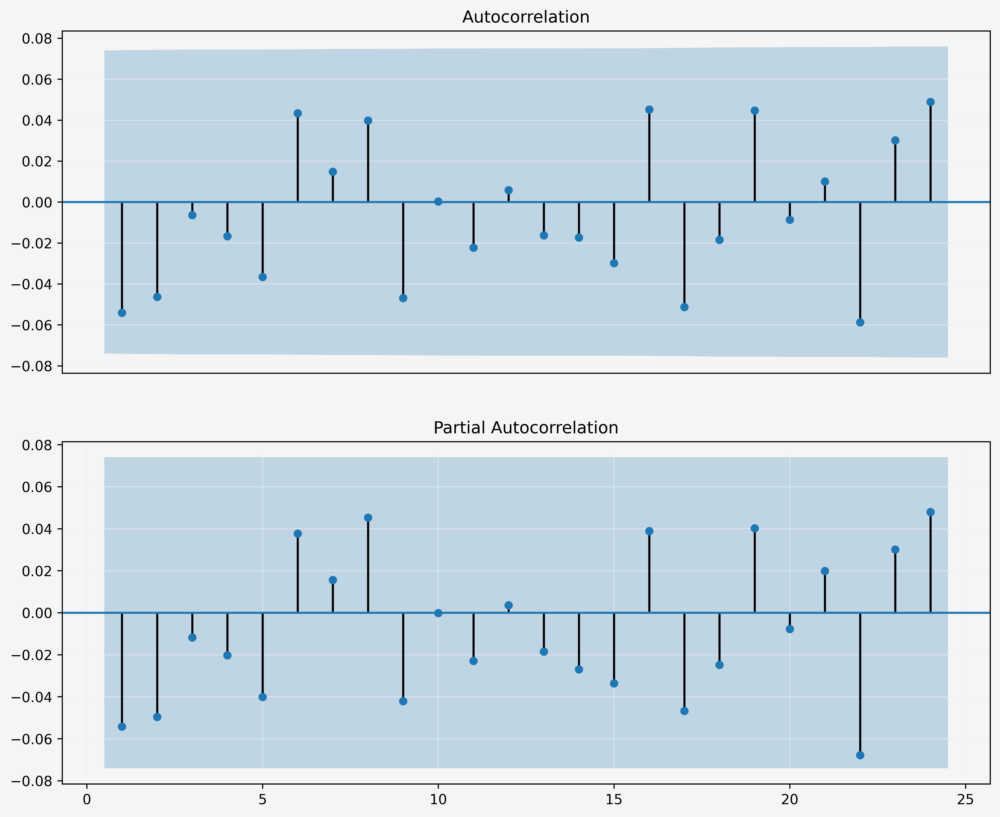

In [ ]:
make_autocorr_plot(d_first_diff)

<Figure size 9000x4200 with 0 Axes>

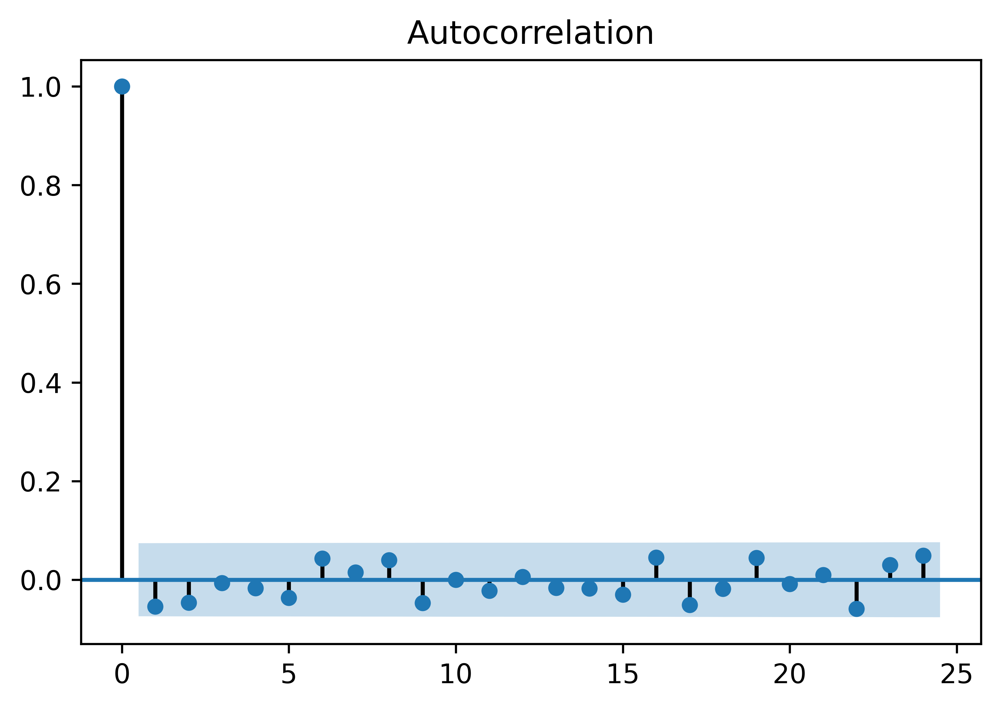

In [ ]:
plt.figure(figsize=(15,7))
plot_acf(d_first_diff, lags = 24)
plt.show()

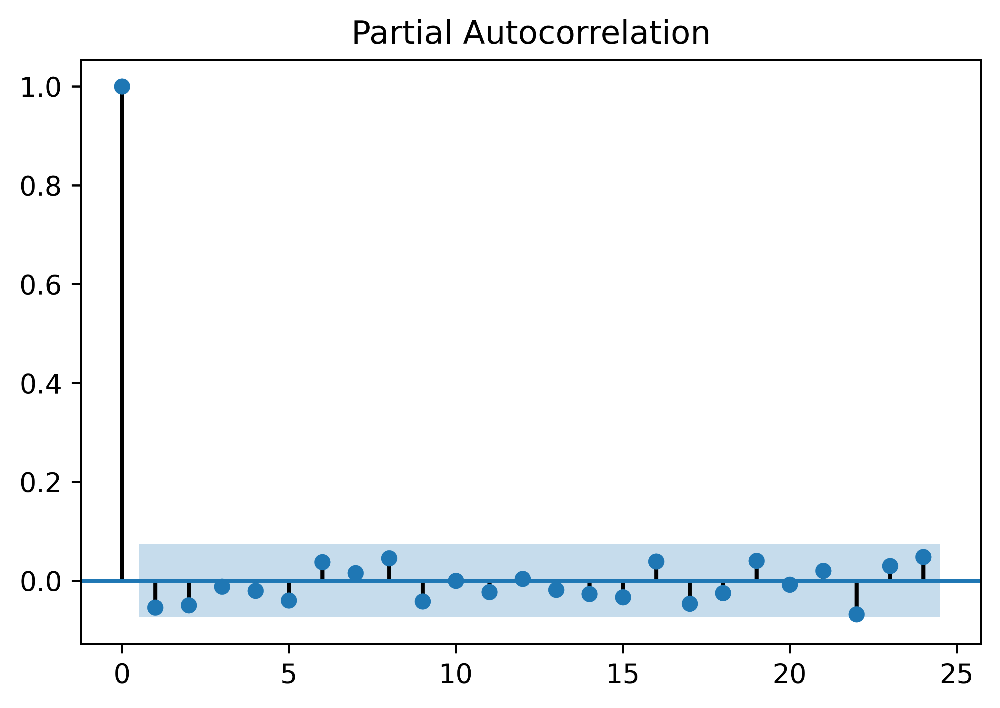

In [ ]:
plot_pacf(d_first_diff, lags = 24)
plt.show()

### Вторая разность

In [ ]:
d_second_diff = d_first_diff.shift(1) - d_first_diff[0:len(d_first_diff)]

In [ ]:
d_second_diff.head()

,RTS
TRADEDATE,
2020-03-20,NaN
2020-03-21,95.64
2020-03-22,0.00
2020-03-23,0.00
2020-03-24,41.10


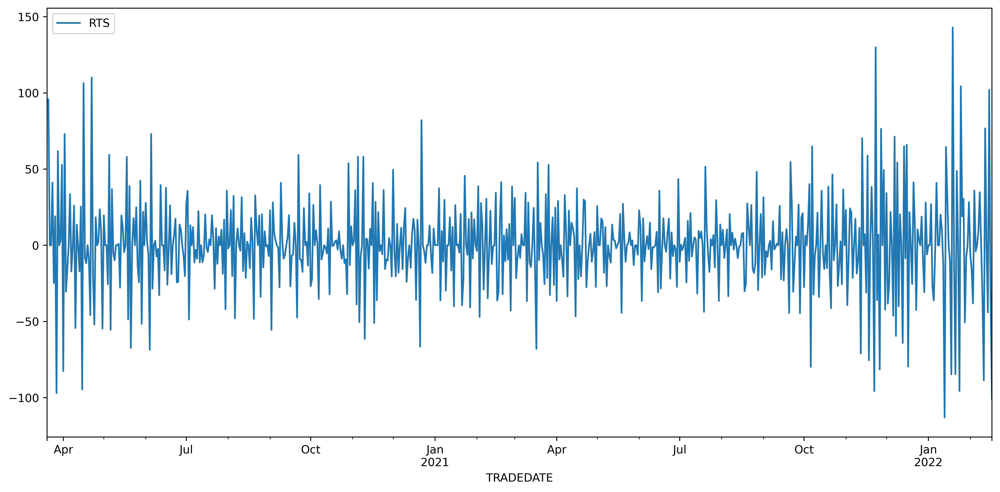

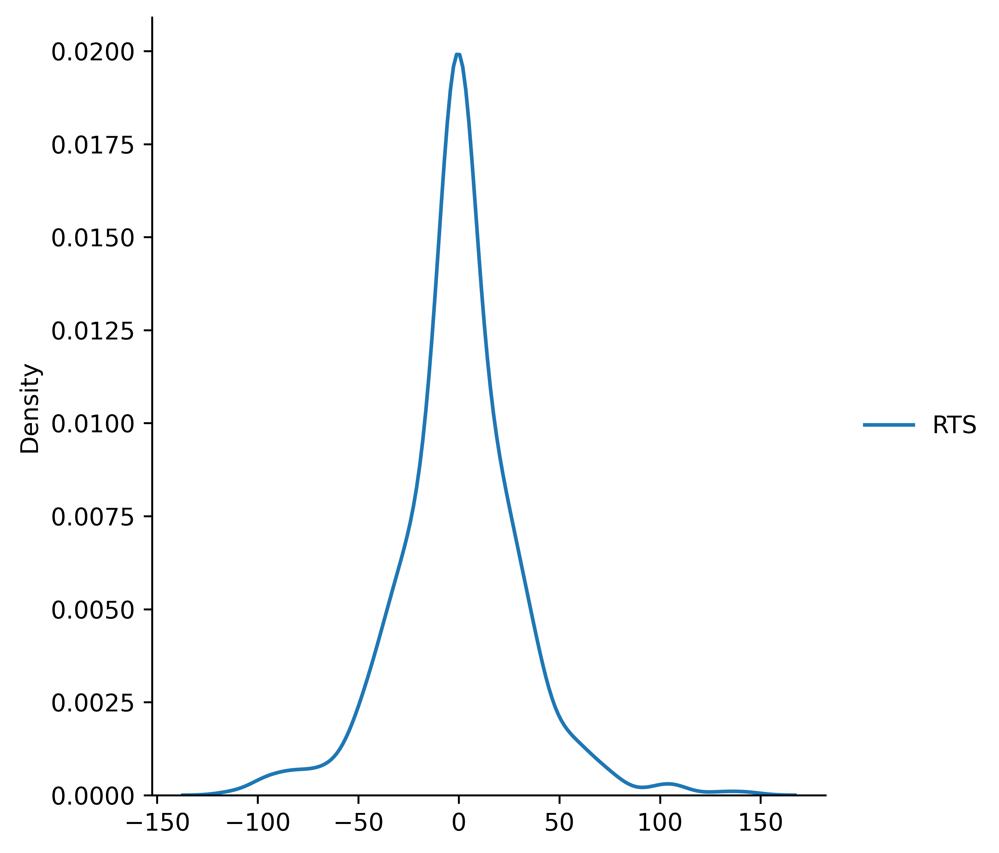

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


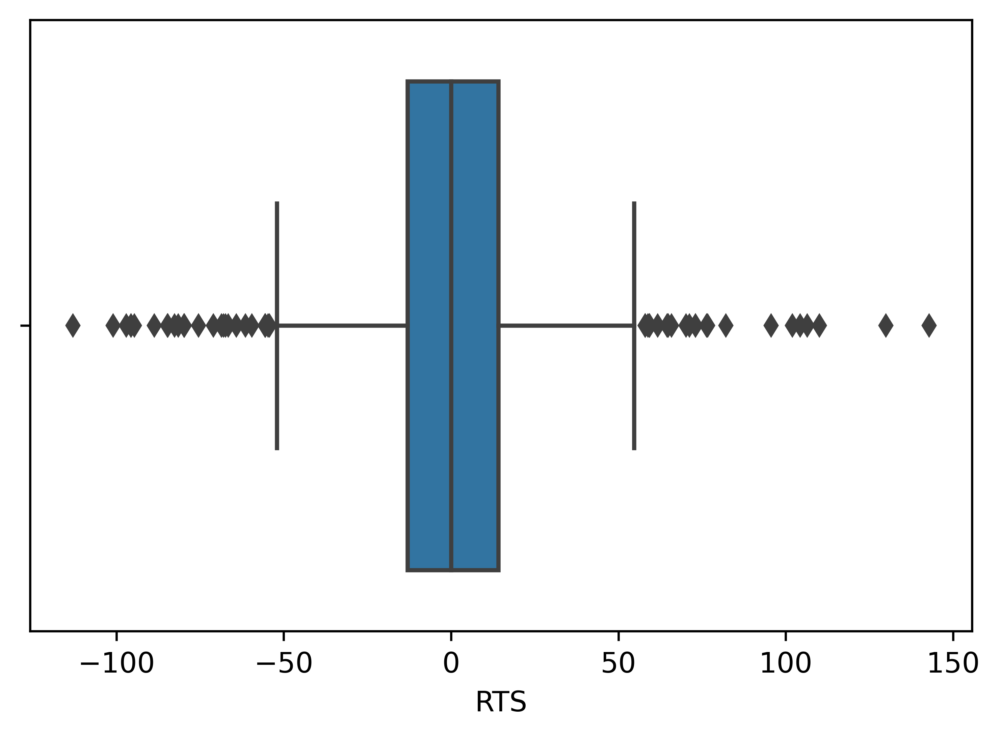

In [ ]:
graphs(d_second_diff)

In [ ]:
kurt_skew(d_second_diff['RTS'])

excess kurtosis of normal distribution (should be 0): 2.6737202170954886
skewness of normal distribution (should be 0): 0.2372449827919


In [ ]:
d_second_diff = outliers(d_second_diff, 3)

Тест Jarque Bera
        JB               p-value              skew           kurtosis    
-------------------------------------------------------------------------
215.0726820300585 1.984086001971122e-47 0.2372449827919 5.673720217095489
-------------------------------------------------------------------------

Тест Шапиро-Уилк
Statistics=0.950, p-value=0.000
Отклонить гипотезу о нормальности
None


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


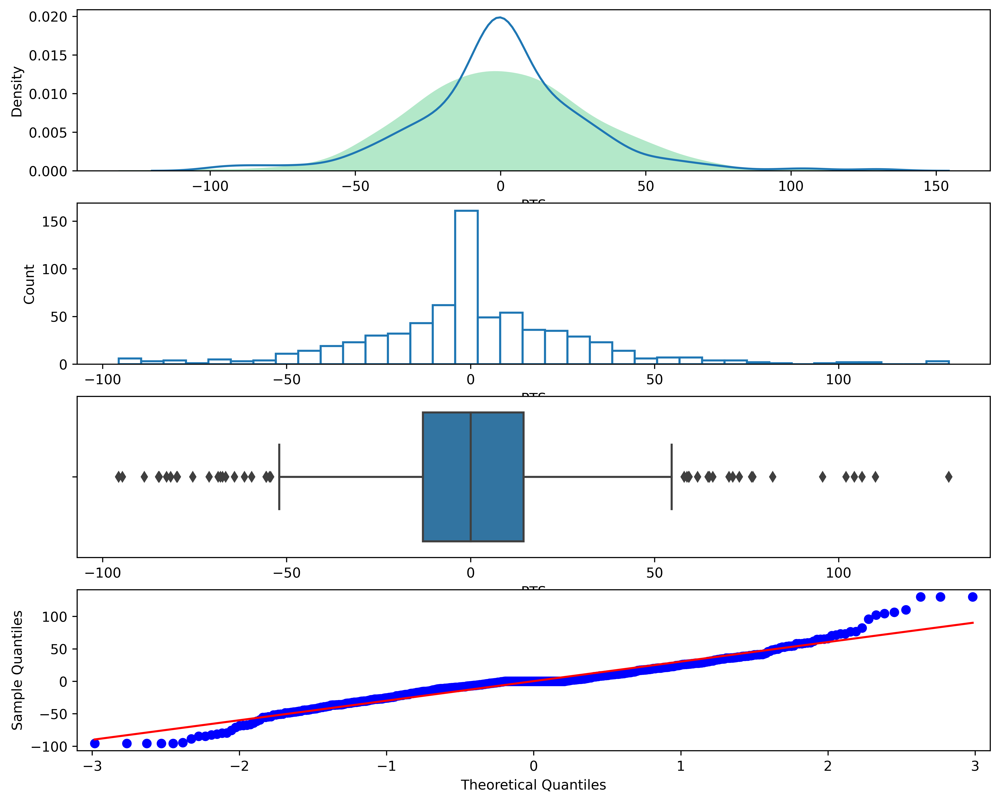

In [ ]:
get_distribution(d_second_diff['RTS'])

In [ ]:
median_criterion(d_second_diff['RTS'])
abbe_criterion(d_second_diff['RTS'])


Число серий = 539 больше рассчитанного 299.180328059703: True
Максимальная длина серии = 3 меньше рассчитанного 9.368044879112068: True
При нарушении хоть одного условия, ряд не стационарный
0.0
['+', '+', ' ', ' ', '+', '-', '+', '-', '+', ' ', '+', '+', '-', '+', '-', '-', ' ', '+', '-', '-', '+', '-', '+', ' ', '-', '+', '-', '+', '-', '-', ' ', '-', '-', '+', '-', '-', '+', ' ', '+', '+', '+', '-', '+', ' ', ' ', '-', '+', '-', '+', '-', '-', ' ', ' ', '+', '-', '+', '+', '-', ' ', '+', '-', '+', '-', '+', '+', ' ', '+', '-', '-', '+', '-', '+', ' ', '+', '+', '-', '-', '+', '-', ' ', '+', '-', '-', '-', '+', ' ', ' ', '-', '+', '-', '-', '+', '-', ' ', '+', '+', '-', '-', '+', '+', ' ', '-', '-', '+', '+', '-', '+', ' ', '+', '-', '-', '-', '+', '-', ' ', '-', '-', '+', '-', '-', '+', ' ', '+', '+', '-', '+', '-', '+', ' ', '+', '-', '+', '-', '+', '-', ' ', '+', '-', '+', '-', '+', '+', ' ', '-', '+', '-', '+', '-', '+', ' ', '-', '+', '+', '-', '+', '+', ' ', '+', '-', '+', '-',

In [ ]:
t_f_criterion(d_second_diff['RTS'])

Тестирование средних. Статистика Стьюдента: 0.01971416643938673. Критическое значение: 1.6492314108421735
Тестирование дисперсий. Статистика Фишера: 1.2123144424477574. Критическое значение: 1.19283654798872


In [ ]:
print('Сиджел-Тьюки')
siegel_tukey(d_second_diff['RTS'])
print('Манна-Уитни')
test_mannwhitneyu(d_second_diff['RTS'])

Сиджел-Тьюки
z value: 0.611
Probably the same distribution
Манна-Уитни
stat=6.11e+04, p=6.11e+04
Probably the same distribution


In [ ]:
dicky_fuller(d_second_diff['RTS'])

ADF Statistic: -10.418265
p-value: 0.000000
Critical Values:
	1%: -3.440
	5%: -2.866
	10%: -2.569
p-value > 0.05: Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.
p-value <= 0.05: Reject the null hypothesis (H0), the data does not have a unit root and is stationary.


Либо МА либо АР(1) на второй разности, но для AR надо промоделировать остатки отдельно

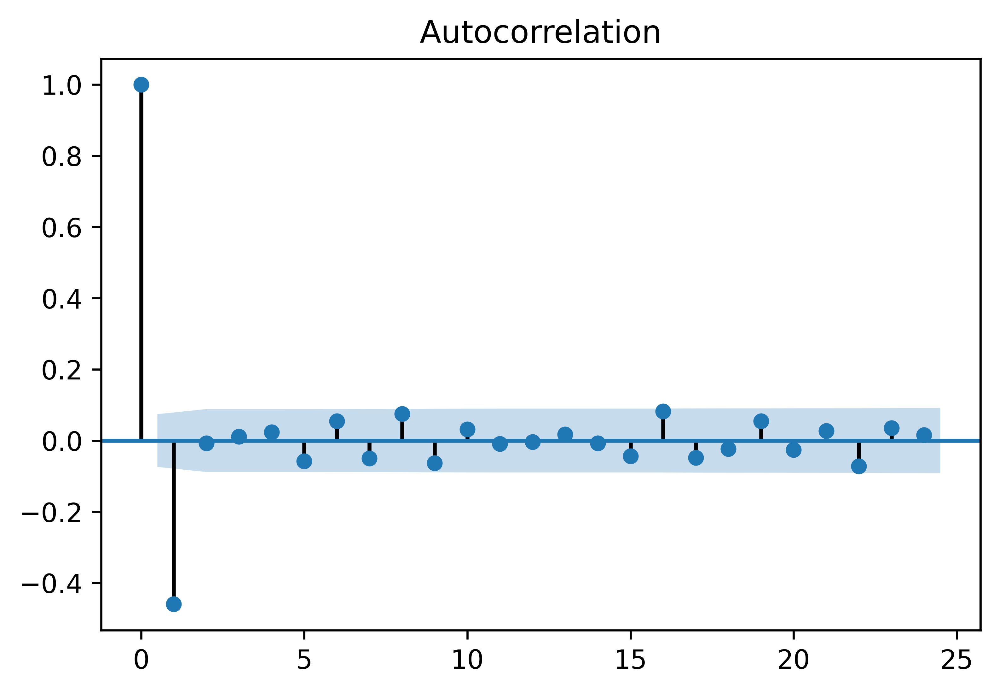

In [ ]:
plot_acf(d_second_diff, lags = 24)
plt.show()
# по нему смотрим порядок ма, тут получается ма1

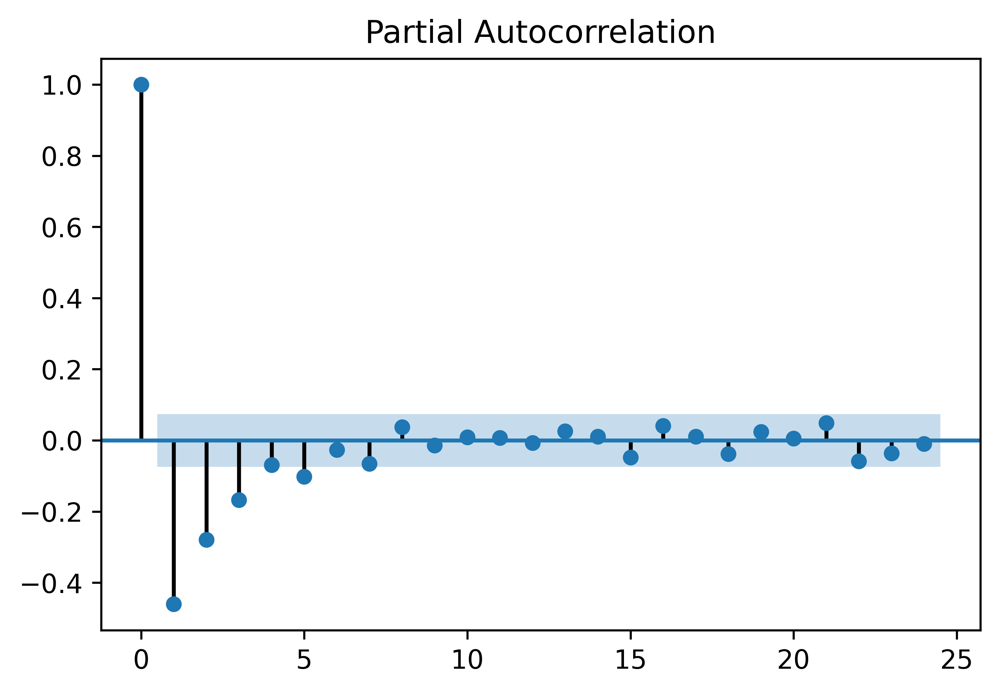

In [ ]:
plot_pacf(d_second_diff, lags = 24)
plt.show()
# по нему порядок ар можно взять от от 1 до 5

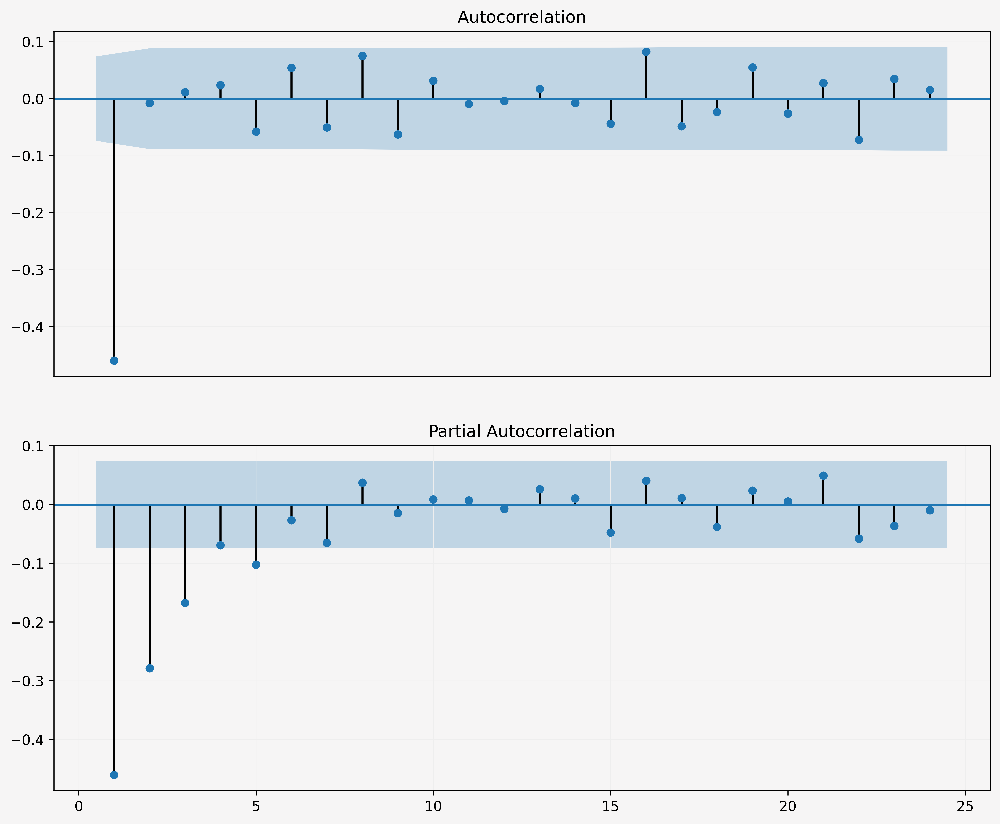

In [ ]:
make_autocorr_plot(d_second_diff['RTS'])

### АРИМА на первой разности

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

In [ ]:
d_first_diff = d_first_diff.dropna()

In [ ]:
arima_model = ARIMA(d_first_diff['RTS'], order=(0,0,1))
model = arima_model.fit()
print(model.summary())
print(model.aic)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                    RTS   No. Observations:                  700
Model:                     ARMA(0, 1)   Log Likelihood               -3118.102
Method:                       css-mle   S.D. of innovations             20.811
Date:                Sun, 05 Jun 2022   AIC                           6242.205
Time:                        17:31:08   BIC                           6255.858
Sample:                    03-20-2020   HQIC                          6247.483
                         - 02-17-2022                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.6104      0.737     -0.828      0.408      -2.055       0.834
ma.L1.RTS     -0.0633      0.041     -1.554      0.121      -0.143       0.017
                                    Roots           

In [ ]:
arima_model = ARIMA(d_first_diff['RTS'], order=(1,0,1))
model = arima_model.fit()
print(model.summary())
print(model.aic)

                              ARMA Model Results                              
Dep. Variable:                    RTS   No. Observations:                  700
Model:                     ARMA(1, 1)   Log Likelihood               -3117.261
Method:                       css-mle   S.D. of innovations             20.786
Date:                Sun, 05 Jun 2022   AIC                           6242.521
Time:                        17:31:08   BIC                           6260.726
Sample:                    03-20-2020   HQIC                          6249.558
                         - 02-17-2022                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.6234      0.676     -0.922      0.357      -1.949       0.702
ar.L1.RTS      0.5276      0.288      1.832      0.067      -0.037       1.092
ma.L1.RTS     -0.5938      0.272     -2.183      0.0

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


In [ ]:
arima_model = ARIMA(d_first_diff['RTS'], order=(1,0,0))
model = arima_model.fit()
print(model.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                    RTS   No. Observations:                  700
Model:                     ARMA(1, 0)   Log Likelihood               -3118.224
Method:                       css-mle   S.D. of innovations             20.815
Date:                Sun, 05 Jun 2022   AIC                           6242.448
Time:                        17:31:08   BIC                           6256.101
Sample:                    03-20-2020   HQIC                          6247.726
                         - 02-17-2022                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.6082      0.744     -0.817      0.414      -2.067       0.851
ar.L1.RTS     -0.0569      0.039     -1.471      0.142      -0.133       0.019
                                    Roots           

### ARIMA на второй разности

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

In [ ]:
d_second_diff = d_second_diff.dropna()

In [ ]:
arima_model = ARIMA(d_second_diff['RTS'], order=(0,0,1))
model_good = arima_model.fit()
print(model_good.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                    RTS   No. Observations:                  700
Model:                     ARMA(0, 1)   Log Likelihood               -3171.557
Method:                       css-mle   S.D. of innovations             22.358
Date:                Sun, 05 Jun 2022   AIC                           6349.115
Time:                        17:31:08   BIC                           6362.768
Sample:                    03-20-2020   HQIC                          6354.392
                         - 02-17-2022                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0007      0.004      0.176      0.861      -0.007       0.009
ma.L1.RTS     -0.9999      0.004   -238.893      0.000      -1.008      -0.992
                                    Roots           

In [ ]:
arima_model = ARIMA(df_d['RTS'], order=(1,2,0))
model_good = arima_model.fit()
print(model_good.summary())

                             ARIMA Model Results                              
Dep. Variable:                 D2.RTS   No. Observations:                  698
Model:                 ARIMA(1, 2, 0)   Log Likelihood               -3272.385
Method:                       css-mle   S.D. of innovations             26.287
Date:                Sun, 05 Jun 2022   AIC                           6550.769
Time:                        18:10:45   BIC                           6564.414
Sample:                    03-22-2020   HQIC                          6556.045
                         - 02-17-2022                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -0.0584      0.663     -0.088      0.930      -1.358       1.241
ar.L1.D2.RTS    -0.5017      0.033    -15.184      0.000      -0.566      -0.437
                                    Roots   

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


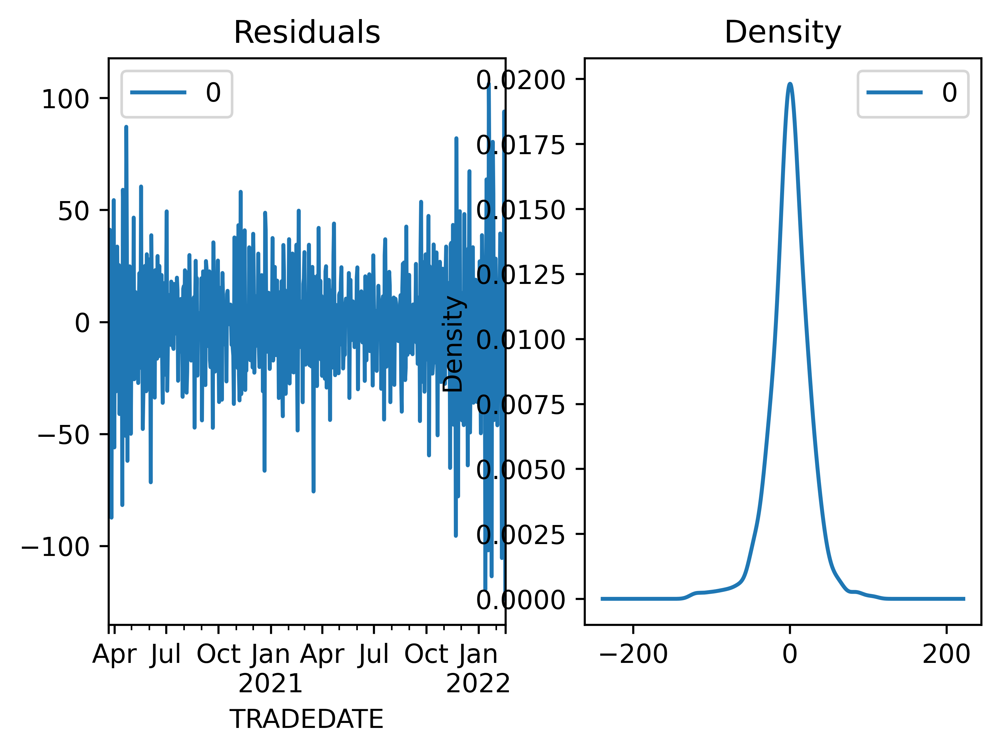

In [ ]:
residuals = pd.DataFrame(model_good.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

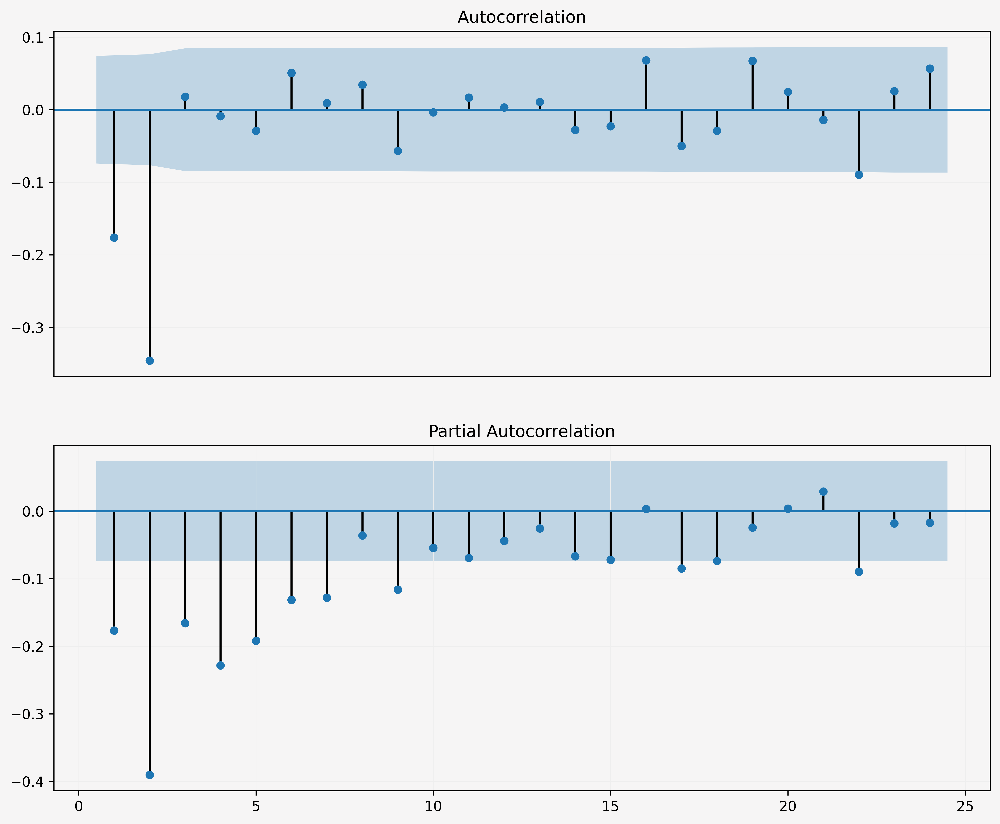

In [ ]:
make_autocorr_plot(residuals)

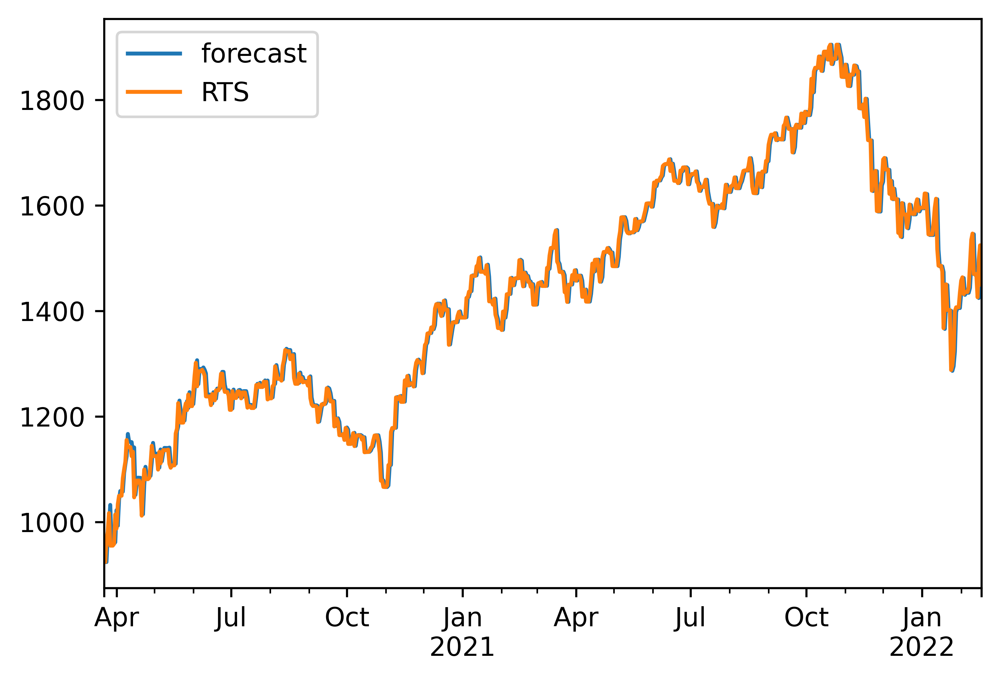

In [ ]:
model_good.plot_predict(dynamic=False)
plt.show()

In [ ]:
fc, se, conf = model_good.forecast(15, alpha=0.05)  # 95% conf

In [ ]:
firsthand = pd.Series(df_d['RTS'])

In [ ]:
# Make as pandas series
fc_series = pd.Series(fc)
lower_series = pd.Series(conf[:, 0])
upper_series = pd.Series(conf[:, 1])

# Plot
# plt.figure(figsize=(12,5))
# plt.plot(pd.Series(df_d['RTS']))
plt.plot(fc_series)
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.show()

In [ ]:
arima_model = ARIMA(d_second_diff['RTS'], order=(1,0,0))
model = arima_model.fit()
print(model.summary())
print(model.aic)

In [ ]:
arima_model = ARIMA(d_second_diff['RTS'], order=(1,0,1))
model = arima_model.fit()
print(model.summary())
print(model.aic)

In [ ]:
pip install pmdarima

In [ ]:
import pmdarima as pm
model = pm.auto_arima(d_second_diff['RTS'], start_p=1, start_q=1,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=None,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(model.summary())

Коэффициенты значима модель надо будет проверить по критериям информационным

In [ ]:
arima_model = ARIMA(d_second_diff['RTS'], order = (1,0,0))
model = arima_model.fit()
print(model.summary())

Константа не значима

In [ ]:
arima_model = ARIMA(d_second_diff['RTS'], order = (1,0,1))
model = arima_model.fit()
print(model.summary())

АР не значим

![image.png](
  
)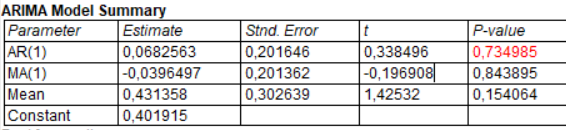

In [ ]:
t.ppf(0.05, len(d_first_diff)/2)

In [ ]:
d_first_diff.to_excel("data_course_first_diff.xlsx")

In [ ]:
df_d.to_excel("data_course_days.xlsx")

# Агрегация по неделям

In [ ]:
def stationarity_tests(data):
  print('='*10)
  t_f_criterion(data)
  print('='*10)
  siegel_tukey(data)
  test_mannwhitneyu(data)
  print('='*10)
  median_criterion(data)
  print('='*10)
  updown_criteria(data)
  print('='*10)
  abbe_criterion(data)
  print('='*10)
  dicky_fuller(data)
  print('='*10)
  


можно будет сделать сплайн, сначала линейная, потом квадратичная

In [ ]:
df_w = df.resample('W',  on='TRADEDATE').mean().ffill()
print(df_w.head(7))

                  RTS
TRADEDATE            
2017-02-26  1146.7850
2017-03-05  1106.8440
2017-03-12  1077.6825
2017-03-19  1080.7240
2017-03-26  1123.0420
2017-04-02  1123.2340
2017-04-09  1134.7300


In [ ]:
df_w.describe()

,RTS
count,261.000000
mean,1297.832460
std,210.060329
min,912.140000
25%,1132.230000
50%,1243.402500
75%,1442.858000
max,1890.270000


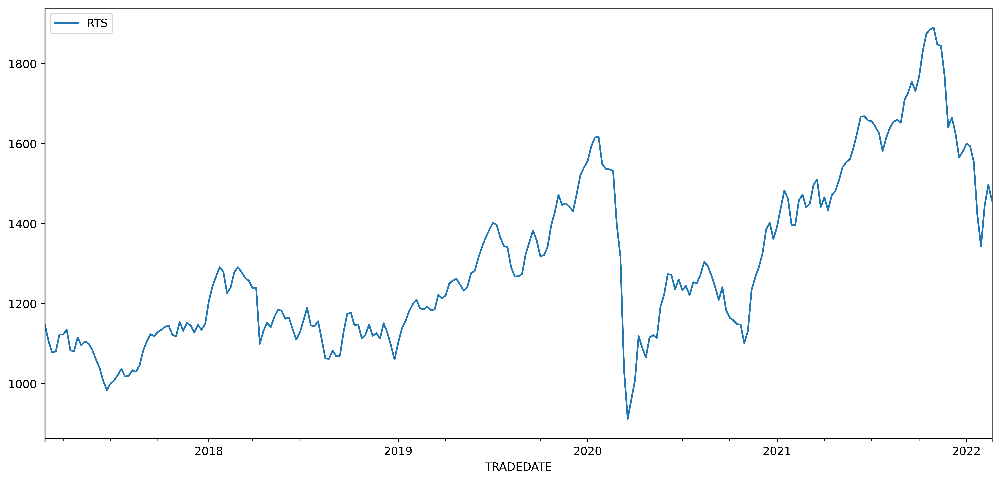

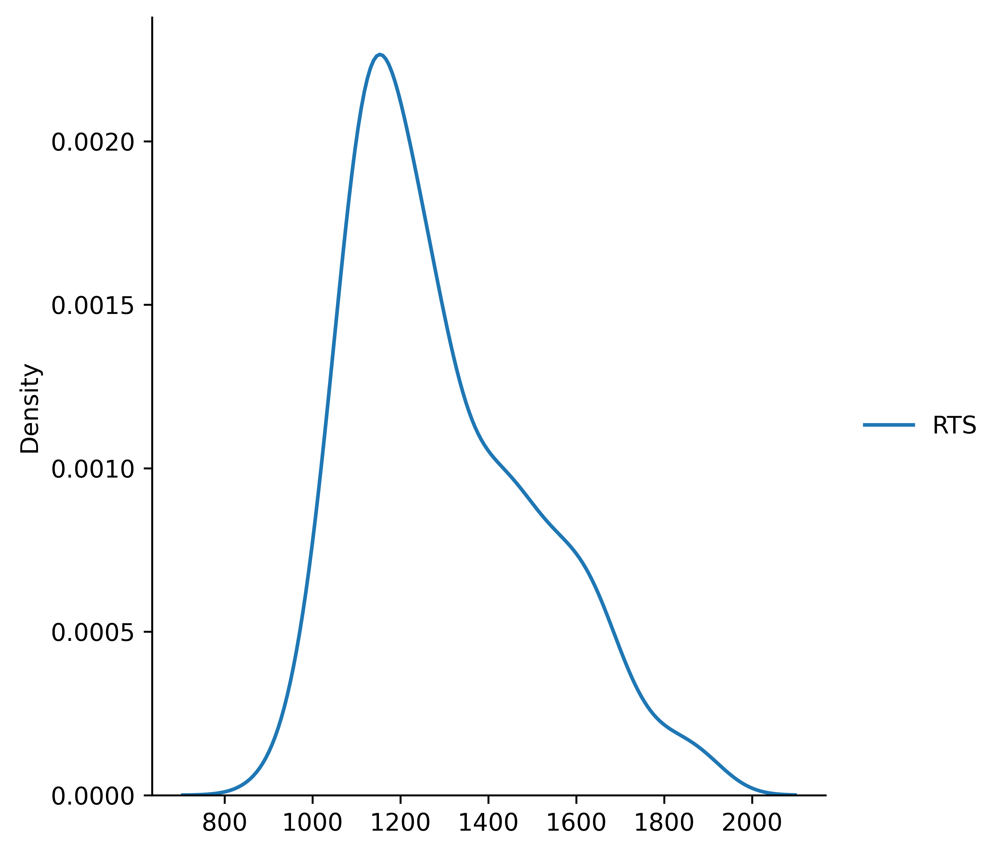

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


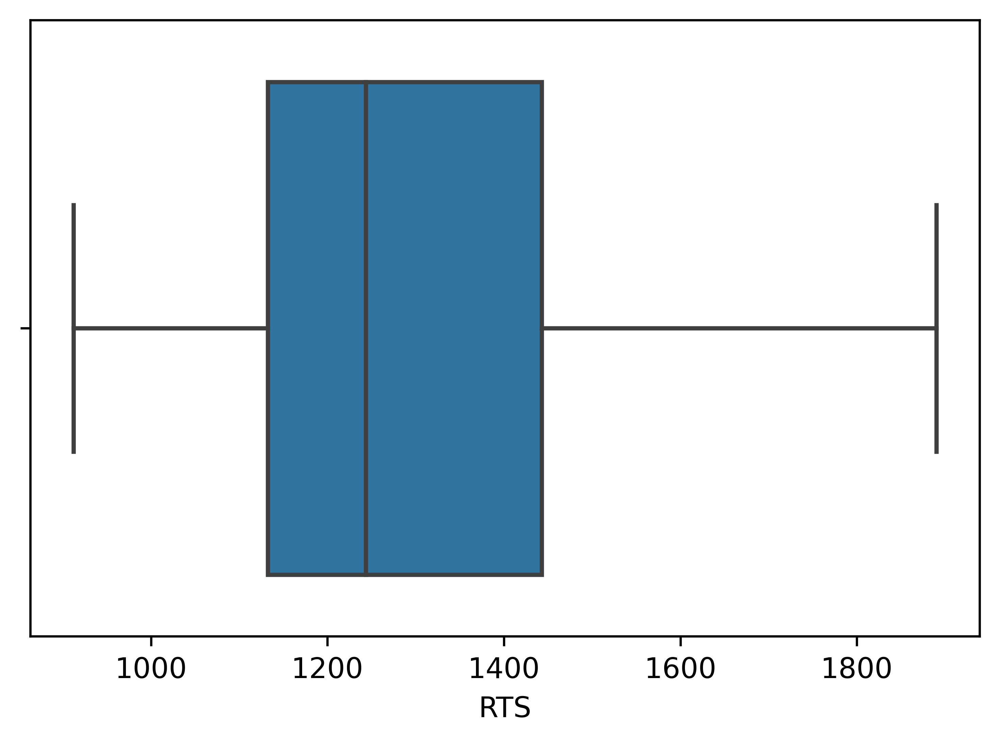

In [ ]:
graphs(df_w)

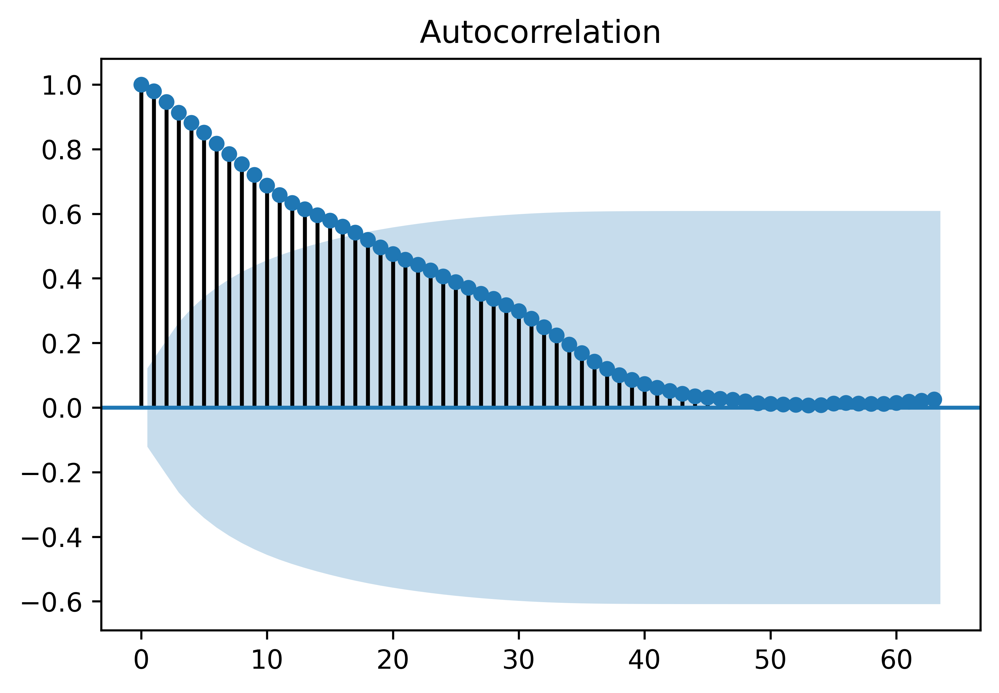

In [ ]:
plot_acf(df_w['RTS'], lags=63)
plt.show()

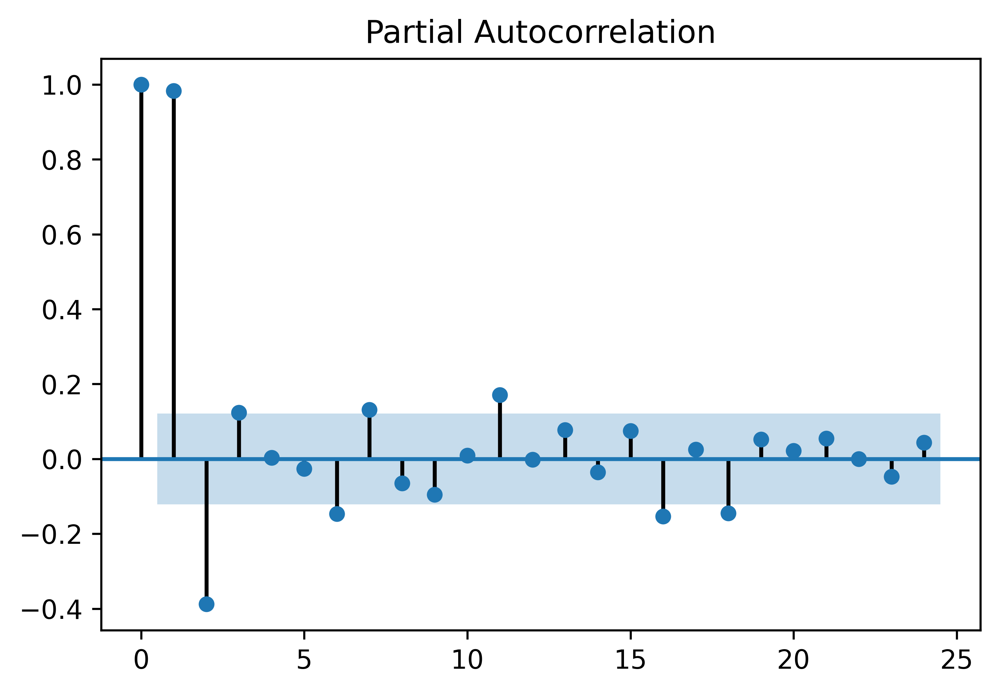

In [ ]:
plot_pacf(df_w['RTS'], lags=24)
plt.show()

In [ ]:
kurt_skew(df_w['RTS'])

excess kurtosis of normal distribution (should be 0): -0.16929954324993313
skewness of normal distribution (should be 0): 0.7841370808508702


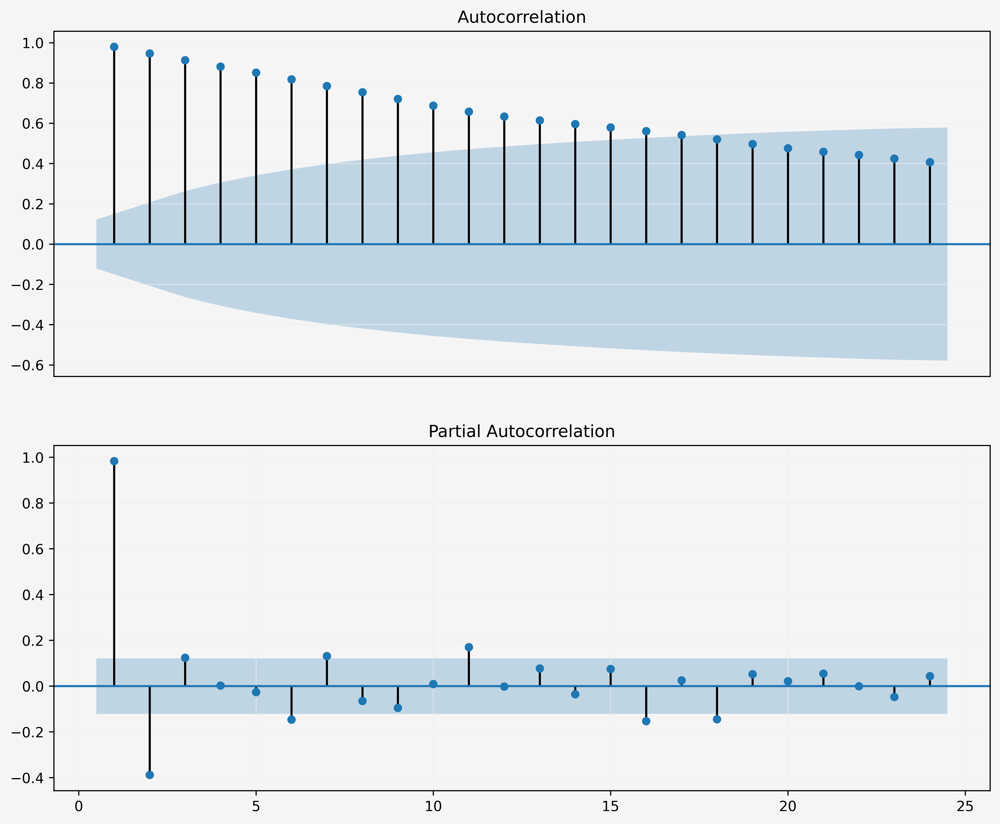

In [ ]:
make_autocorr_plot(df_w['RTS'])

In [ ]:
df_w.to_excel("data_course_weeks.xlsx")

In [ ]:
stationarity_tests(df_w['RTS'])

Тестирование средних. Статистика Стьюдента: -1.1850691860738798. Критическое значение: 1.6567515939762396
Тестирование дисперсий. Статистика Фишера: 5.442035415341471. Критическое значение: 1.3365010428024782
z value: 2.667
Probably different distributions
stat=2.14e+03, p=2.14e+03
Probably different distributions
Число серий = 19 больше рассчитанного 99.89594962666969: False
Максимальная длина серии = 65 меньше рассчитанного 7.957264182471452: False
При нарушении хоть одного условия, ряд не стационарный
1243.4025000000001
['-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', ' ', '+', '+', '+', '-', '-', '+', '+', '+', '+', '+', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', '-', 

In [ ]:
w_first_diff = df_w.shift(1) - df_w[0:len(df_w)]
w_first_diff = w_first_diff.dropna()

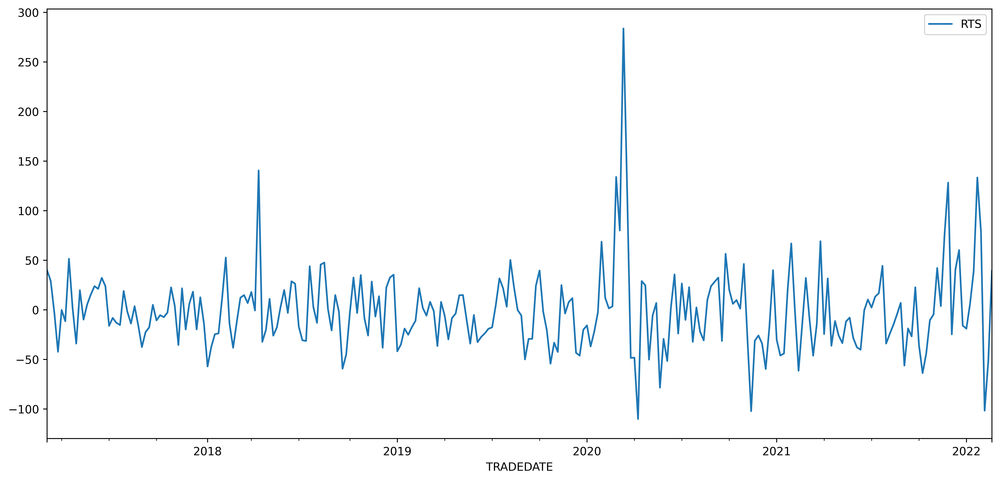

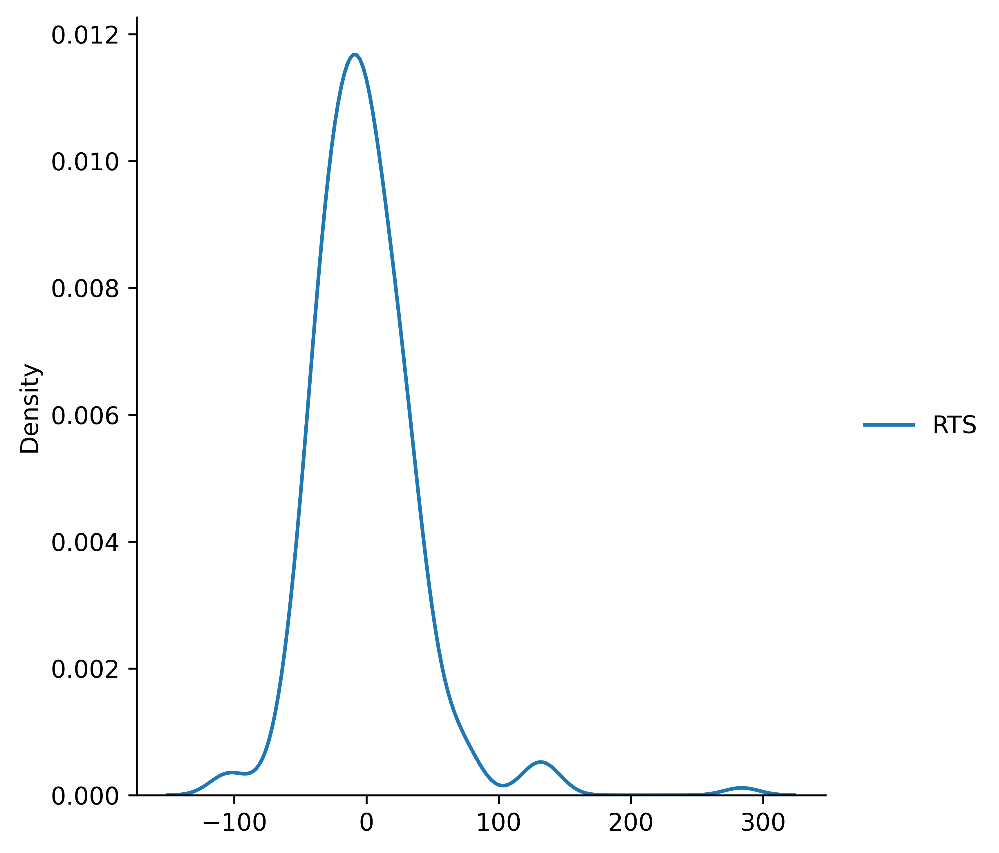

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


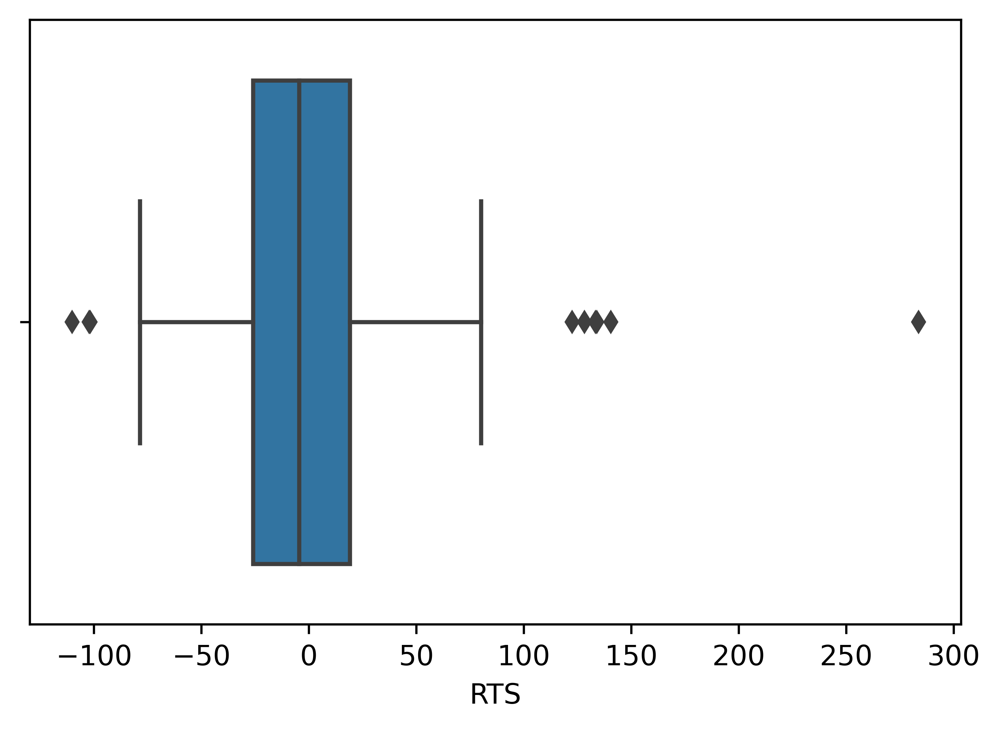

In [ ]:
graphs(w_first_diff)

In [ ]:
w_first_diff = outliers(w_first_diff, 7)

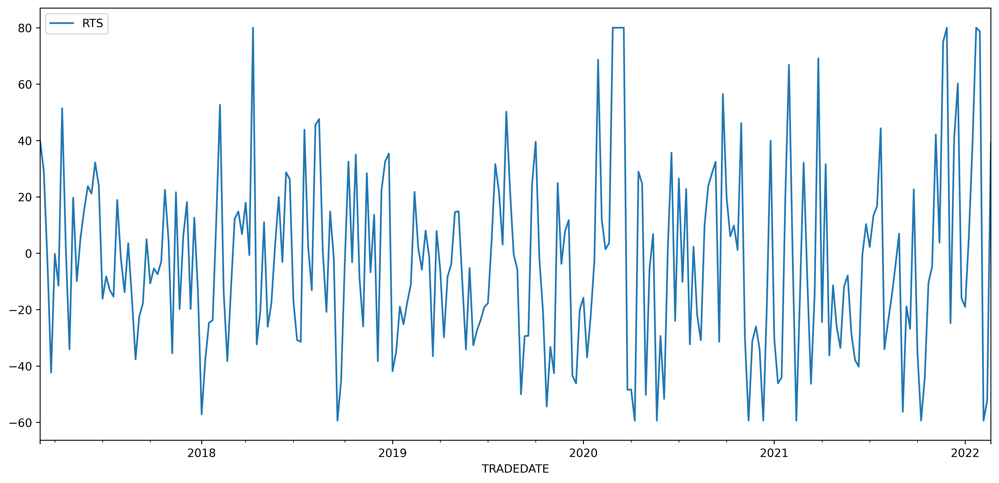

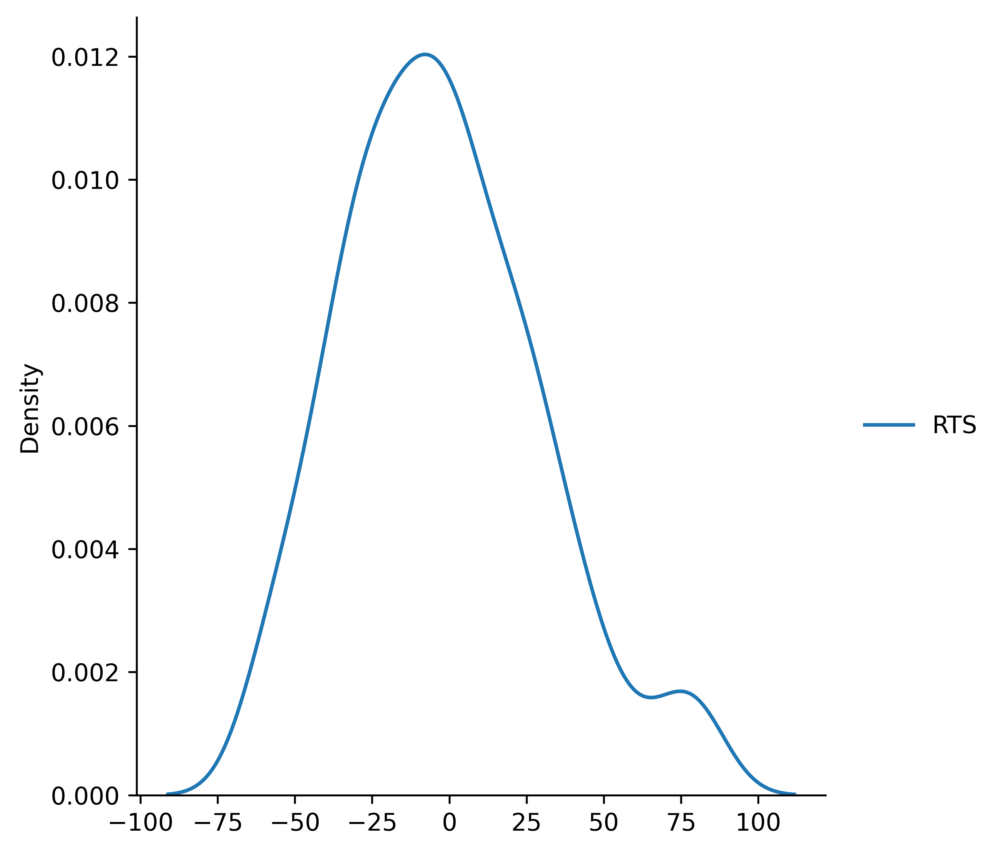

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


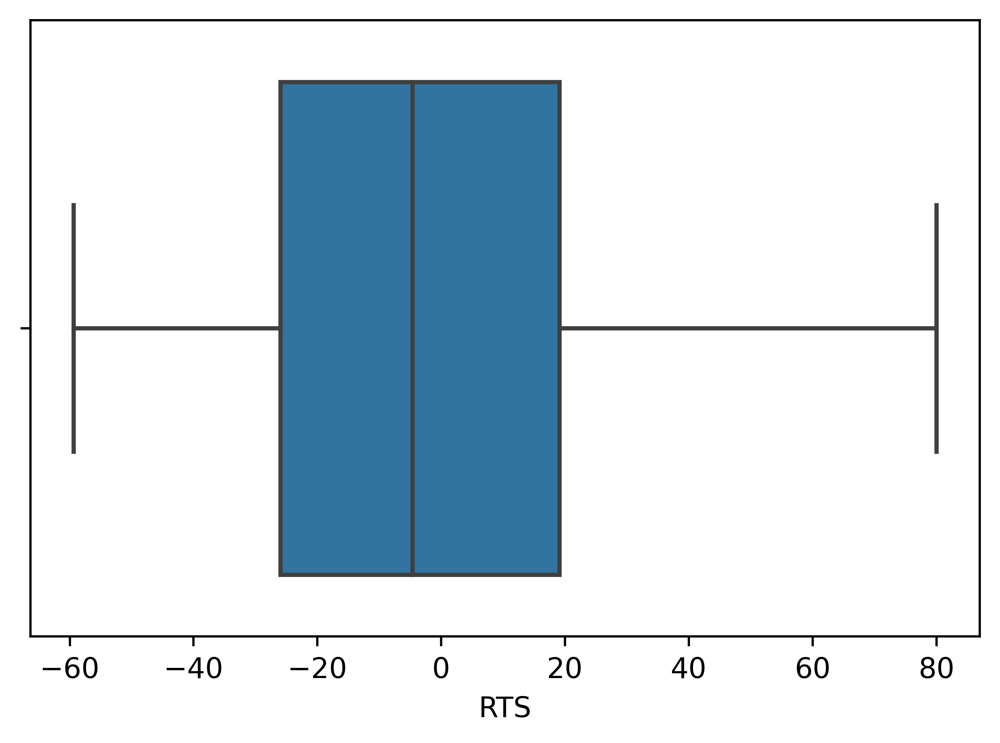

In [ ]:
graphs(w_first_diff)

In [ ]:
kurt_skew(w_first_diff['RTS'])

excess kurtosis of normal distribution (should be 0): -0.007815669801968905
skewness of normal distribution (should be 0): 0.5060135986264339


In [ ]:
stationarity_tests(w_first_diff['RTS'])

Тестирование средних. Статистика Стьюдента: 0.041890710692983904. Критическое значение: 1.6567515939762396
Тестирование дисперсий. Статистика Фишера: 2.2804834269735887. Критическое значение: 1.337380547457587
z value: 4.131
Probably different distributions
stat=7.71e+03, p=7.71e+03
Probably the same distribution
Число серий = 101 больше рассчитанного 99.45678519871508: True
Максимальная длина серии = 8 меньше рассчитанного 7.951774732352204: False
При нарушении хоть одного условия, ряд не стационарный
-4.628000000000043
['+', '+', '+', '-', '+', '-', '+', '+', '-', '+', '-', '+', '+', '+', '+', '+', '+', '-', '-', '-', '-', '+', '+', '-', '+', '-', '-', '-', '-', '+', '-', '-', '-', '+', '+', '+', '-', '+', '-', '+', '+', '-', '+', '-', '-', '-', '-', '-', '+', '+', '-', '-', '-', '+', '+', '+', '+', '+', '+', '-', '-', '+', '-', '-', '+', '+', '+', '+', '+', '-', '-', '-', '+', '+', '-', '+', '+', '+', '-', '+', '+', '-', '-', '+', '+', '+', '+', '-', '-', '+', '-', '+', '-', '+', '+

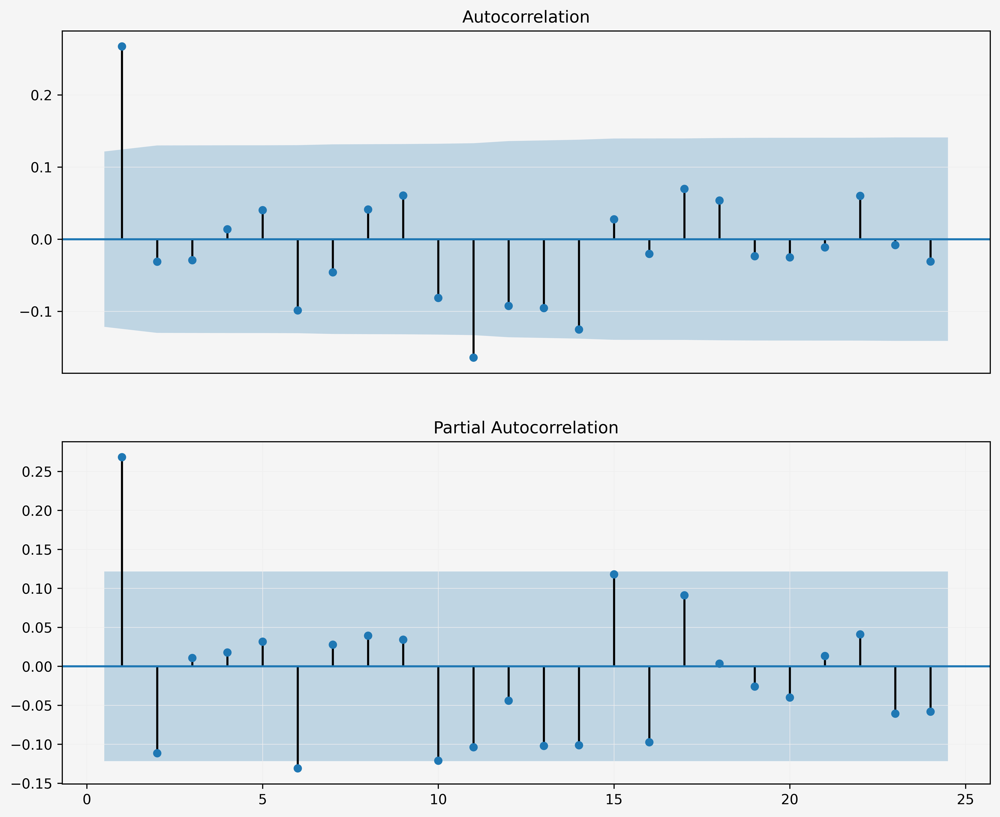

In [ ]:
make_autocorr_plot(w_first_diff)

In [ ]:
w_second_diff = w_first_diff.shift(1) - w_first_diff[0:len(w_first_diff)]
w_second_diff = w_second_diff.dropna()
w_second_diff = outliers(w_second_diff, 6)

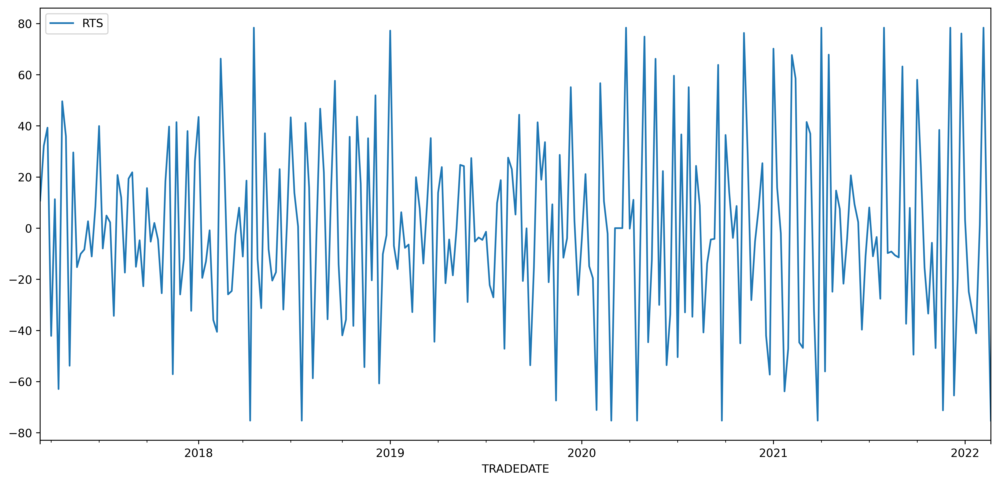

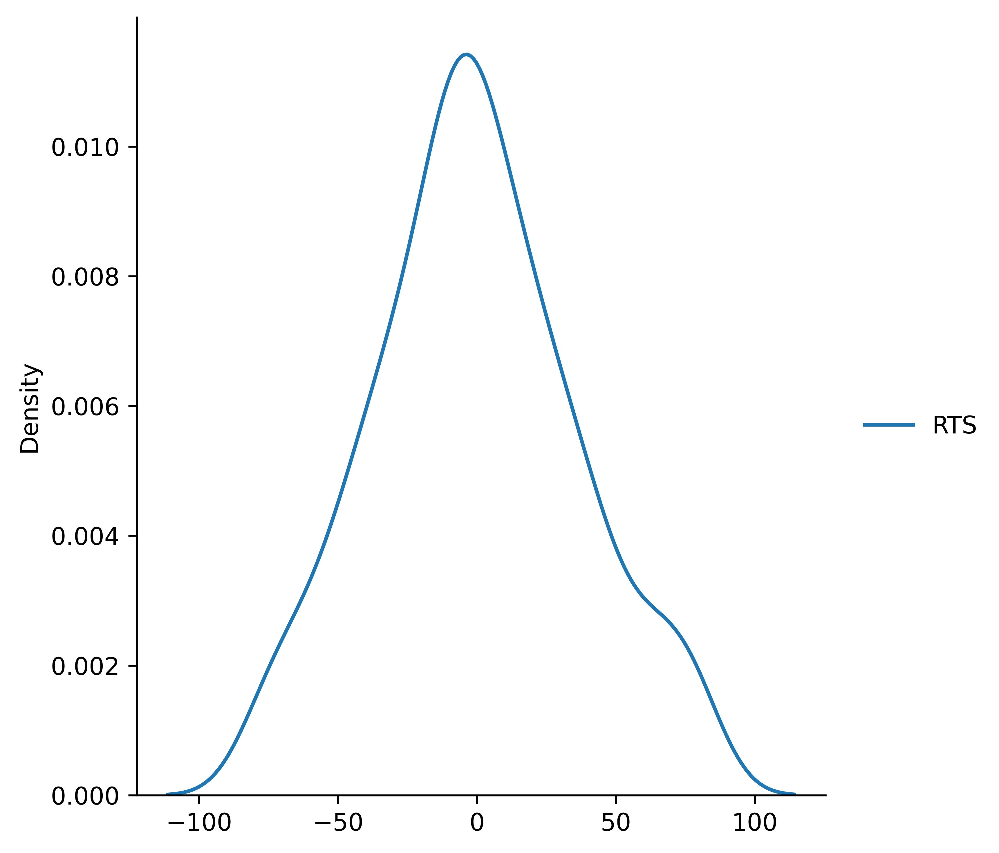

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


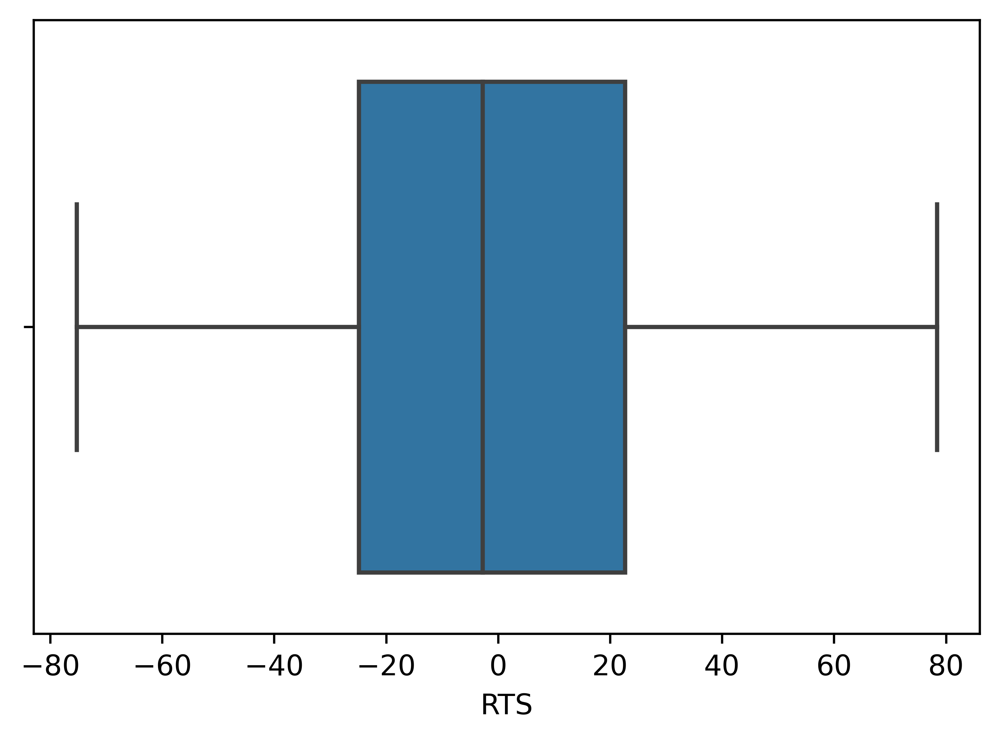

In [ ]:
graphs(w_second_diff)

In [ ]:
kurt_skew(w_second_diff['RTS'])

excess kurtosis of normal distribution (should be 0): -0.3377513022481482
skewness of normal distribution (should be 0): 0.1390947154874017


In [ ]:
stationarity_tests(w_second_diff['RTS'])

Тестирование средних. Статистика Стьюдента: 0.02451177232448787. Критическое значение: 1.6567515939762396
Тестирование дисперсий. Статистика Фишера: 1.7698144116734347. Критическое значение: 1.3382729773632955
z value: 1.943
Probably the same distribution
stat=8.05e+03, p=8.05e+03
Probably the same distribution
Число серий = 153 больше рассчитанного 99.01773832775034: True
Максимальная длина серии = 5 меньше рассчитанного 7.946264128230338: True
При нарушении хоть одного условия, ряд не стационарный
-2.7643333333332976
['+', '+', '+', '-', '+', '-', '+', '+', '-', '+', '-', '-', '-', '+', '-', '+', '+', '-', '+', '+', '-', '+', '+', '-', '+', '+', '-', '-', '-', '+', '-', '+', '-', '-', '+', '+', '-', '+', '-', '-', '+', '-', '+', '+', '-', '-', '+', '-', '-', '+', '+', '-', '-', '+', '+', '-', '+', '-', '+', '-', '-', '+', '-', '-', '-', '+', '-', '+', '+', '+', '+', '-', '+', '+', '-', '+', '+', '+', '-', '+', '+', '-', '-', '-', '+', '-', '+', '+', '-', '+', '-', '+', '-', '-', ' ',

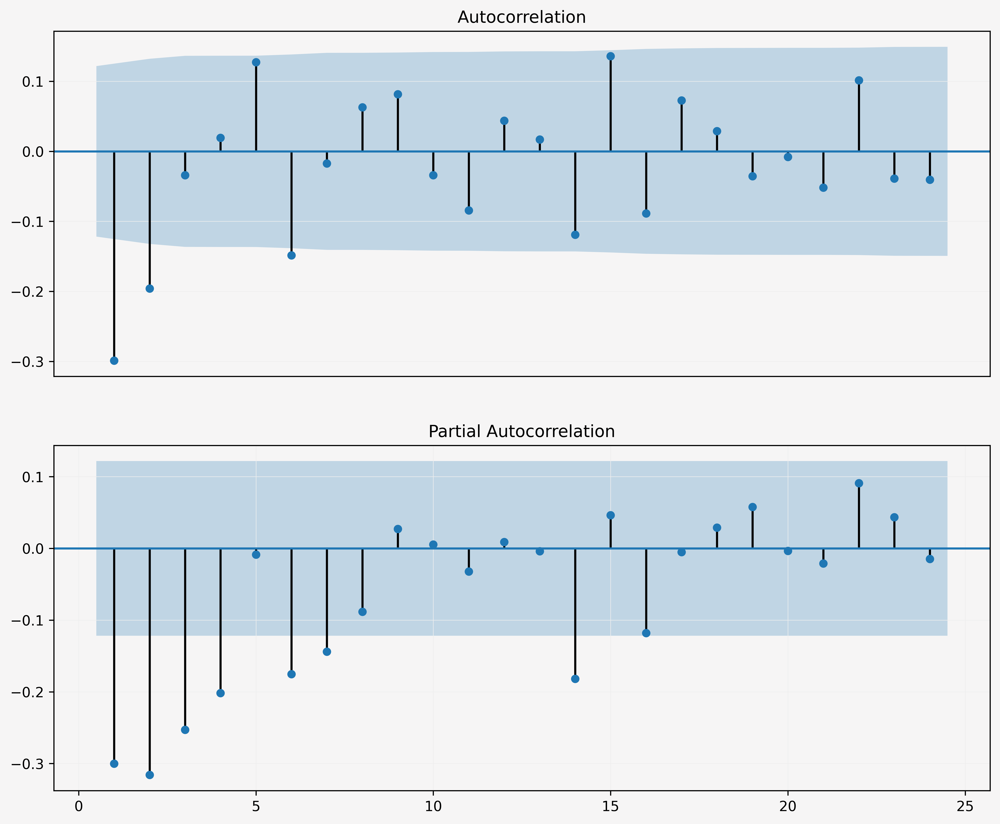

In [ ]:
make_autocorr_plot(w_second_diff)

In [ ]:
df_d.to_excel("data_course_days.xlsx")

In [ ]:
arima_model = ARIMA(df_w['RTS'], order = (1,2,1))
model = arima_model.fit()
print(model.summary())

                             ARIMA Model Results                              
Dep. Variable:                 D2.RTS   No. Observations:                  259
Model:                 ARIMA(1, 2, 1)   Log Likelihood               -1315.050
Method:                       css-mle   S.D. of innovations             38.436
Date:                Sun, 05 Jun 2022   AIC                           2638.100
Time:                        18:35:41   BIC                           2652.327
Sample:                    03-12-2017   HQIC                          2643.820
                         - 02-20-2022                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0008      0.046      0.018      0.986      -0.089       0.091
ar.L1.D2.RTS     0.3129      0.059      5.264      0.000       0.196       0.429
ma.L1.D2.RTS    -1.0000      0.010    -95.95

In [ ]:
arima_model = ARIMA(df_w['RTS'], order = (0,2,2))
model = arima_model.fit()
print(model.summary())

                             ARIMA Model Results                              
Dep. Variable:                 D2.RTS   No. Observations:                  259
Model:                 ARIMA(0, 2, 2)   Log Likelihood               -1314.312
Method:                       css-mle   S.D. of innovations             38.312
Date:                Sun, 05 Jun 2022   AIC                           2636.624
Time:                        18:35:41   BIC                           2650.851
Sample:                    03-12-2017   HQIC                          2642.344
                         - 02-20-2022                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0004      0.042      0.011      0.992      -0.082       0.083
ma.L1.D2.RTS    -0.6684      0.060    -11.208      0.000      -0.785      -0.552
ma.L2.D2.RTS    -0.3316      0.059     -5.64

In [ ]:
arima_model = ARIMA(df_w['RTS'], order = (0,2,1))
model = arima_model.fit()
print(model.summary())

                             ARIMA Model Results                              
Dep. Variable:                 D2.RTS   No. Observations:                  259
Model:                 ARIMA(0, 2, 1)   Log Likelihood               -1328.256
Method:                       css-mle   S.D. of innovations             40.397
Date:                Sun, 05 Jun 2022   AIC                           2662.512
Time:                        18:35:42   BIC                           2673.183
Sample:                    03-12-2017   HQIC                          2666.802
                         - 02-20-2022                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0008      0.033      0.024      0.981      -0.065       0.066
ma.L1.D2.RTS    -0.9999      0.011    -87.167      0.000      -1.022      -0.977
                                    Roots   

Модель ARIMA(0,2,2). Прогноз в статграфиксе

# Агрегация по месяцам

In [ ]:
df_m = df.resample('M',  on='TRADEDATE').mean().ffill()
print(df_m.head(7))

                    RTS
TRADEDATE              
2017-02-28  1133.981667
2017-03-31  1102.872727
2017-04-30  1103.786500
2017-05-31  1092.044500
2017-06-30  1011.599048
2017-07-31  1020.506667
2017-08-31  1041.555652


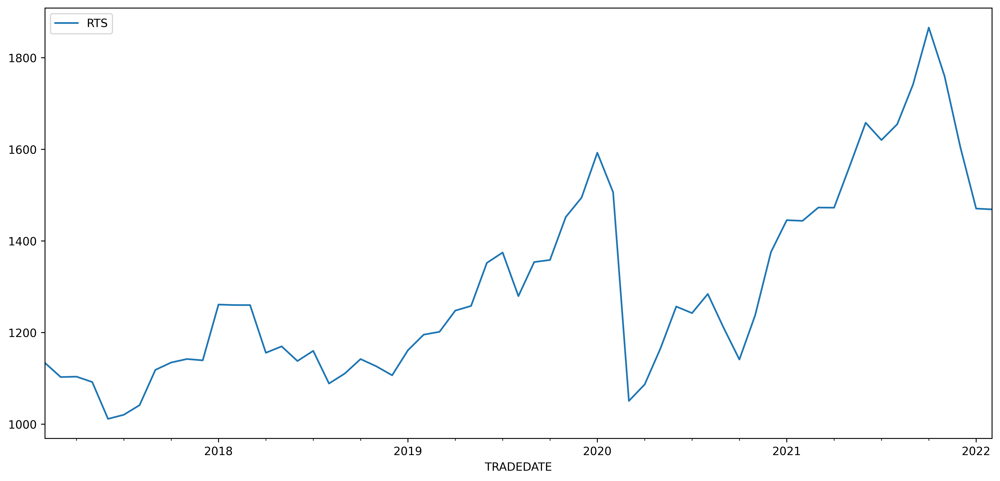

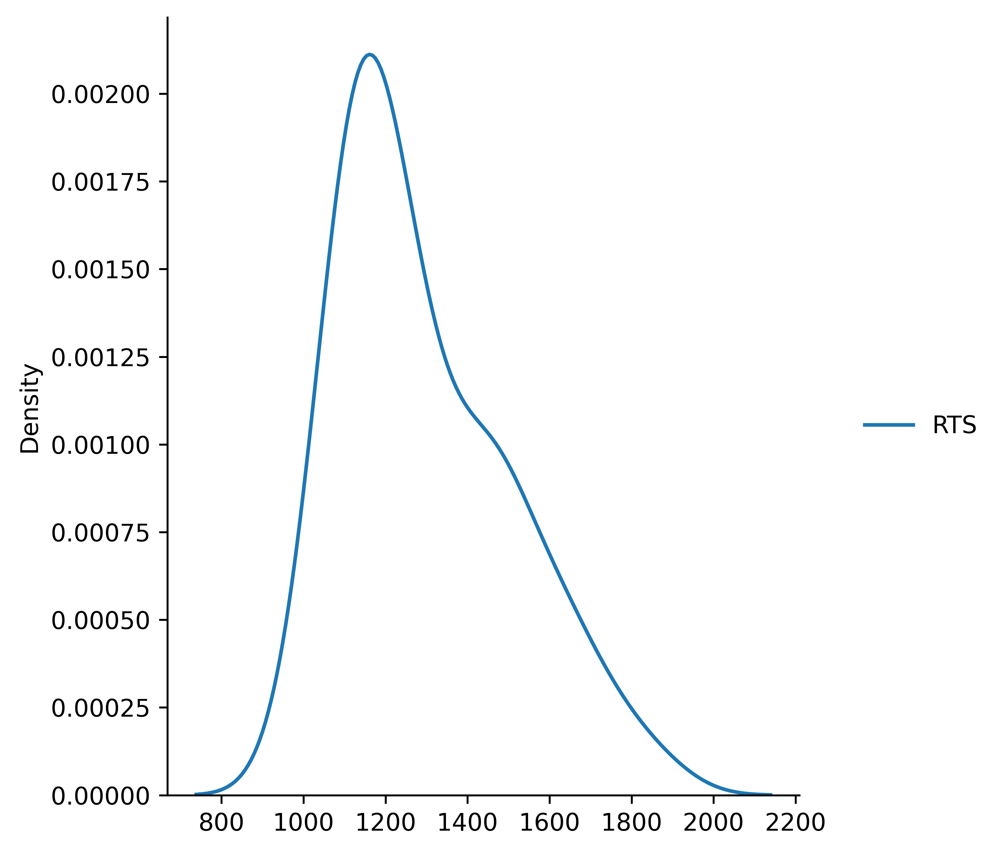

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


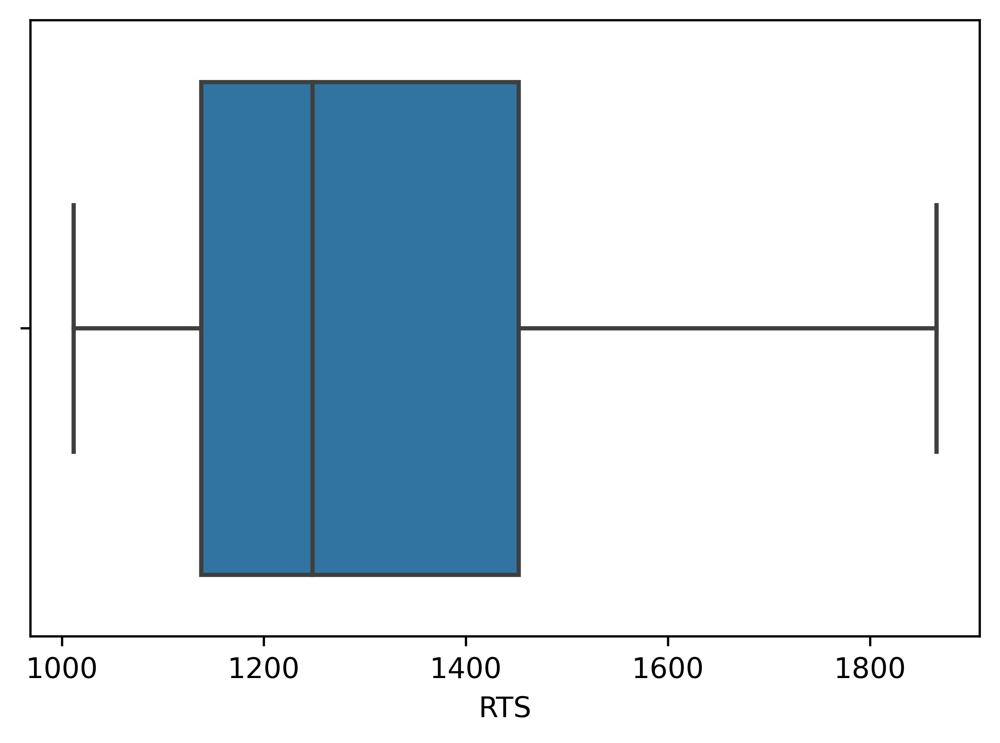

In [ ]:
graphs(df_m)

In [ ]:
kurt_skew(df_m['RTS'])

excess kurtosis of normal distribution (should be 0): -0.2132793236369901
skewness of normal distribution (should be 0): 0.8182915839441744


In [ ]:
df_m.to_excel("data_course_months.xlsx")

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


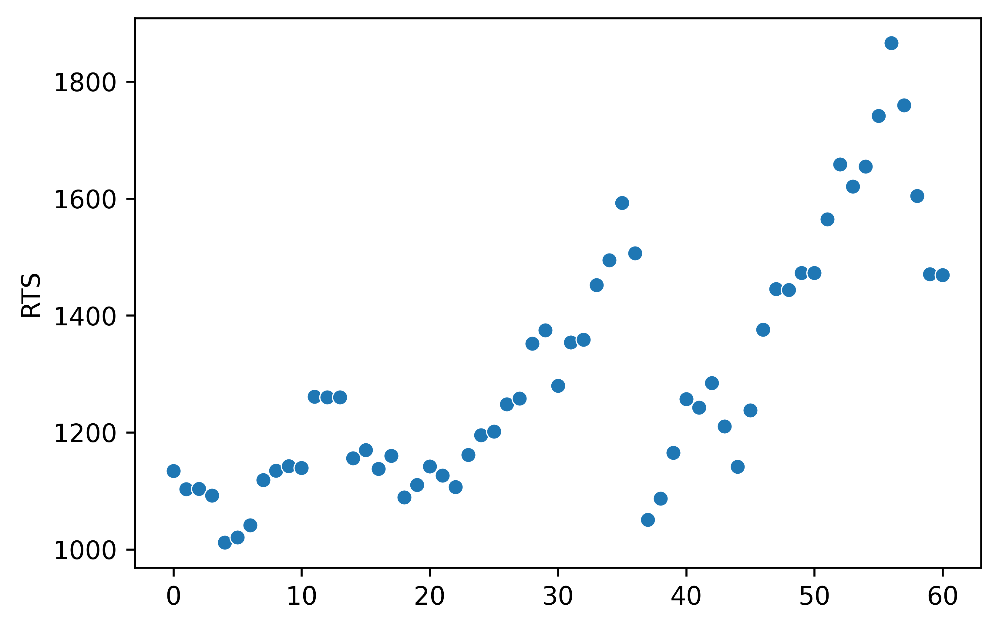

In [ ]:
sns.scatterplot(range(0,len(df_m)), df_m['RTS'])

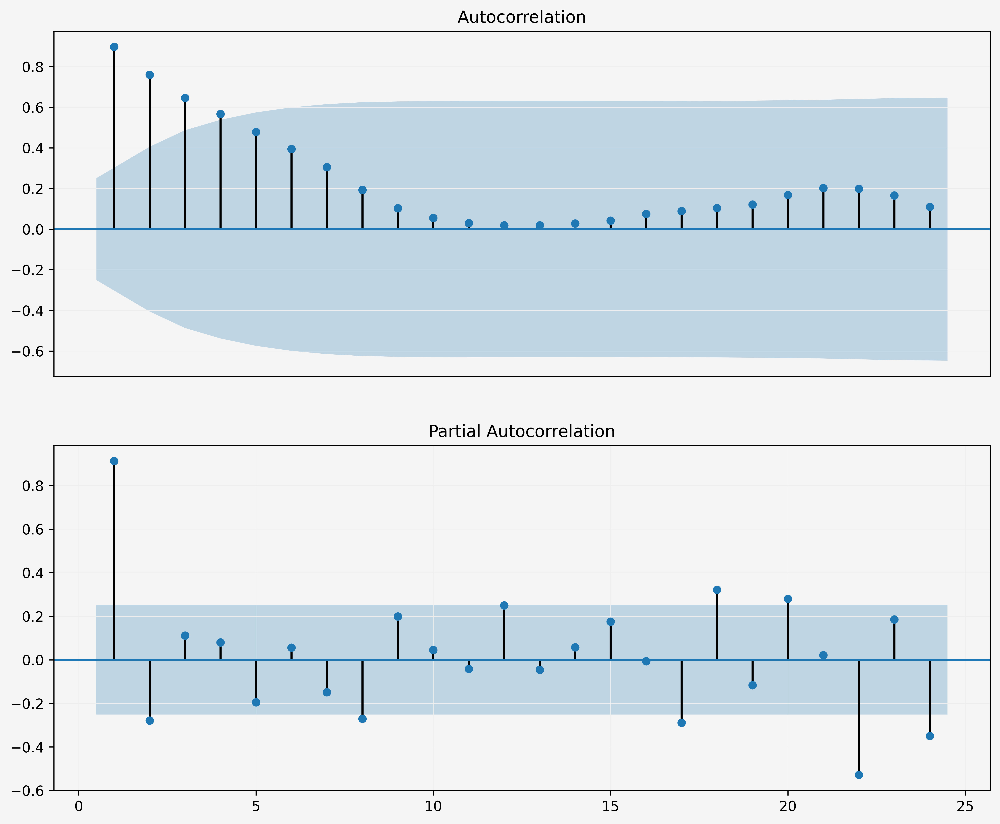

In [ ]:
make_autocorr_plot(df_m['RTS'])

Второй линейный тренд начинается в точке 2020-03-31

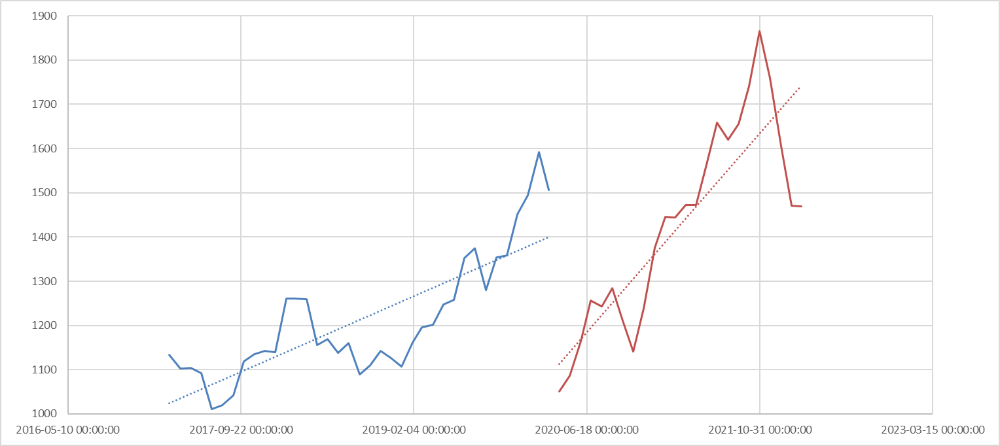

надо либо слайн и остатки на ар1, либо ар1 вообще

в конце каждой главы обзац посвященный модели и ее недостаткам

презентацию можно не высылать и сделать до защиты

еще выслать эксели с рядами

питоне не надо высылать